In [2]:
from utils import *

/bgfs/alee/chelsea/apps/anaconda3/envs/py37/lib/python3.7/site-packages/dask/config.py:161: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  data = yaml.load(f.read()) or {}


# Pre-processing
Re-do pre-processings in `./scVelo.ipynb`

In [3]:
sp = 'AL1' 
adata = scv.read('../data/loom/%s.loom'%(sp), cache=True) # most time-consuming

Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [4]:
print(scv.utils.show_proportions(adata))
adata

Abundance of ['spliced', 'unspliced', 'ambiguous']: [0.74 0.17 0.09]
None


AnnData object with n_obs × n_vars = 8946 × 33538 
    obs: 'Clusters', '_X', '_Y'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced'

## Remove doublets

Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.15
Detected doublet rate = 10.3%
Estimated detectable doublet fraction = 39.4%
Overall doublet rate:
	Expected   = 6.0%
	Estimated  = 26.2%
Elapsed time: 28.2 seconds
8946 scores for 8946 samples


,Clusters,_X,_Y,doublet_bln,doublet_score
index,,,,,
AL1:AAAGTGAGTCATAGTCx,1,-44.622173,-9.466413,False,0.023846
AL1:AAACCCACATGTGGTTx,2,22.097980,-1.667848,False,0.022551
AL1:AAAGAACGTAACAAGTx,13,-7.964261,-39.949814,False,0.044682
AL1:AAACGCTGTAGACACGx,3,28.714943,24.338417,False,0.044682
AL1:AAACCCACATGCCGACx,8,44.594341,-3.974993,False,0.013986
...,...,...,...,...,...
AL1:TTTGGTTCACTTGAGTx,8,39.990829,10.001618,False,0.013098
AL1:TTTGTTGCATCAGCGCx,10,-14.445756,-17.625963,False,0.075940
AL1:TTTGGTTGTGATACAAx,6,2.348069,19.175304,False,0.057692


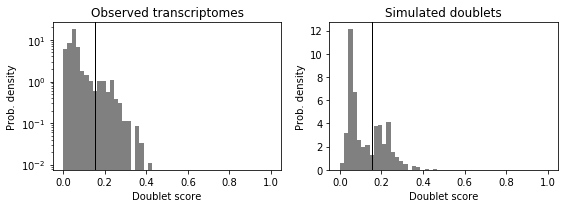

In [5]:
# remove doublets
scrub = scr.Scrublet(adata.X.toarray(), expected_doublet_rate=0.06)
doublet_scores, predicted_doublets = scrub.scrub_doublets(min_counts=2, 
                                                          min_cells=3, 
                                                          min_gene_variability_pctl=85, 
                                                          n_prin_comps=30,
                                                          )

scrub.plot_histogram()
print('%d scores for %d samples'%(len(predicted_doublets), adata.X.shape[0]))

adata.obs['doublet_bln'] = np.array(predicted_doublets)
adata.obs['doublet_score'] = np.array(doublet_scores)
adata.obs

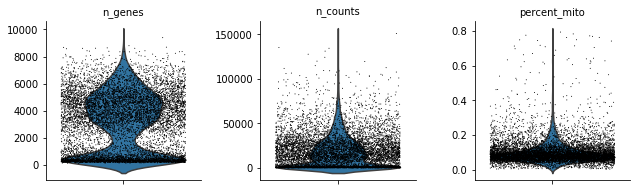

In [8]:
# calc QCs
adata.var_names_make_unique()  # deduplicate gene names

mito_genes = adata.var_names.str.startswith('MT-')
adata.obs['percent_mito'] = np.sum(adata[:, mito_genes].X, axis=1).A1 / np.sum(adata.X, axis=1).A1
adata.obs['n_counts'] = adata.X.sum(axis=1).A1
adata.obs['n_genes'] = np.sum(adata.X > 0, axis=1)

sc.pl.violin(adata, ['n_genes', 'n_counts', 'percent_mito'], 
             jitter=0.4, multi_panel=True)

In [9]:
adata_raw = adata[(adata.obs['n_genes'] >= 2000) & (adata.obs['n_counts'] >= 8000) & (adata.obs['n_counts'] <= 100000) & (adata.obs['percent_mito'] < 0.15) & (adata.obs['doublet_bln'] == False)]
adata_raw

View of AnnData object with n_obs × n_vars = 4614 × 33538 
    obs: 'Clusters', '_X', '_Y', 'doublet_bln', 'doublet_score', 'percent_mito', 'n_counts', 'n_genes'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced'

In [10]:
!mkdir ../data/scVelo
adata_raw.write('../data/scVelo/AL1_ref_raw.h5ad')

In [11]:
# adata_ref_norm: Only filter min_cell genes
adata_ref_norm = adata_raw.copy()

### Normalization
scv.pp.filter_genes(adata_ref_norm, min_cells=2)
scv.pp.normalize_per_cell(adata_ref_norm, layers=['spliced', 'unspliced']) # 3 layers all been normalized by / cts
scv.pp.log1p(adata_ref_norm) # only adata_ref_norm.X is log1p (loge(x+1))

scv.pp.moments(adata_ref_norm, n_pcs=30, n_neighbors=30, mode='connectivities', method='umap', use_rep=None)
adata_ref_norm

Filtered out 11650 genes that are detected in less than 2 cells (spliced).
Normalized count data: X, spliced, unspliced.
computing neighbors
    finished (0:00:08) --> added to `.uns['neighbors']`
    'distances', weighted adjacency matrix
    'connectivities', weighted adjacency matrix
computing moments based on connectivities
    finished (0:00:09) --> added 
    'Ms' and 'Mu', moments of spliced/unspliced abundances (adata.layers)


AnnData object with n_obs × n_vars = 4614 × 21888 
    obs: 'Clusters', '_X', '_Y', 'doublet_bln', 'doublet_score', 'percent_mito', 'n_counts', 'n_genes', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
    uns: 'pca', 'neighbors'
    obsm: 'X_pca'
    varm: 'PCs'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced', 'Ms', 'Mu'

In [12]:
adata_ref_norm.write('../data/scVelo/AL1_ref_norm.h5ad')

In [13]:
# adata: filter min_cell genes & keep only variably expressed genes
adata = adata_raw.copy()

### Normalization
scv.pp.filter_genes(adata, min_cells=2)
scv.pp.filter_genes_dispersion(adata, flavor='seurat', n_top_genes=3000)
scv.pp.normalize_per_cell(adata, layers=['spliced', 'unspliced']) # 3 layers all been normalized by / cts

scv.pp.log1p(adata) # only adata.X is log1p (loge(x+1))

# Smoothing (and PCA has been calc in this step)
scv.pp.moments(adata, n_pcs=30, n_neighbors=30, mode='connectivities', method='umap', use_rep=None)
adata

Filtered out 11650 genes that are detected in less than 2 cells (spliced).
Normalized count data: X, spliced, unspliced.
computing neighbors
    finished (0:00:01) --> added to `.uns['neighbors']`
    'distances', weighted adjacency matrix
    'connectivities', weighted adjacency matrix
computing moments based on connectivities
    finished (0:00:01) --> added 
    'Ms' and 'Mu', moments of spliced/unspliced abundances (adata.layers)


AnnData object with n_obs × n_vars = 4614 × 3000 
    obs: 'Clusters', '_X', '_Y', 'doublet_bln', 'doublet_score', 'percent_mito', 'n_counts', 'n_genes', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'means', 'dispersions', 'dispersions_norm'
    uns: 'pca', 'neighbors'
    obsm: 'X_pca'
    varm: 'PCs'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced', 'Ms', 'Mu'

## Clustering

In [14]:
sc.tl.umap(adata)
sc.tl.tsne(adata)

In [15]:
sc.tl.louvain(adata, resolution=0.2)

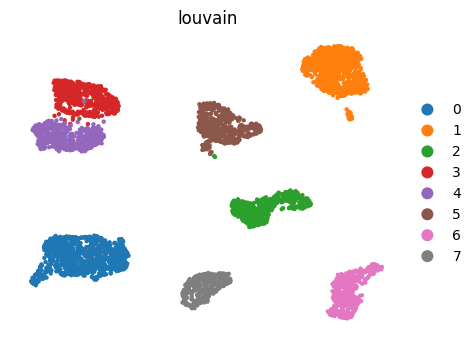

In [16]:
scv.pl.scatter(adata, color=['louvain'], 
               legend_loc='right margin', basis='umap', 
               figsize=(5,4), size=40, dpi=100)


In [17]:
adata.write('../data/scVelo/AL1.h5ad')

# Identify cells

## HEK293

`wget ftp://ftp.ncbi.nlm.nih.gov/geo/samples/GSM1867nnn/GSM1867011/suppl/GSM1867011_HEK_293_C1_USC_RNA_40.txt.gz`

`wget ftp://ftp.ncbi.nlm.nih.gov/geo/samples/GSM1867nnn/GSM1867012/suppl/GSM1867012_HEK_293_C2_USC_RNA_41.txt.gz`

In [28]:
df1 = pd.read_csv('../data/GeoHek293/GSM1867011_HEK_293_C1_USC_RNA_40.txt', sep='\t', index_col=0, names=['control1'])
df2 = pd.read_csv('../data/GeoHek293/GSM1867012_HEK_293_C2_USC_RNA_41.txt', sep='\t', index_col=0, names=['control2'])
df = df1.join(df2, how='inner')
print(df.shape)
df.head(3)

(11887, 2)


,control1,control2
ENSG00000000003.10,2769,2341
ENSG00000000419.8,1359,1829
ENSG00000000457.9,418,327


In [ ]:
ensg = [x.split('.')[0] for x in df.index]

from gprofiler import GProfiler
gp = GProfiler(return_dataframe=True)
res = gp.convert(organism='hsapiens',
            query=ensg,
            target_namespace='EMBL')[['incoming','name']].drop_duplicates()


In [29]:
ensg = [x.split('.')[0] for x in df.index]

from gprofiler import GProfiler
gp = GProfiler(return_dataframe=True)
res = gp.convert(organism='hsapiens',
            query=ensg,
            target_namespace='EMBL')[['incoming','name']].drop_duplicates()

print(res.shape)
res.head(3)

(11887, 2)


,incoming,name
0,ENSG00000000003,TSPAN6
11,ENSG00000000419,DPM1
22,ENSG00000000457,SCYL3


In [30]:
if np.all(res['incoming'].values == np.array(ensg)):
    X = df.values
    log2cpm = np.log2(1e6*X/np.sum(X, axis=0) + 1)
    log2cpmhek293 = pd.DataFrame(log2cpm, index=res['name'], columns=['HEK293_1', 'HEK293_2'])

## other breast cell lines

In [31]:
bulk = pd.read_csv('../data/BulkCellLines/brcaLines.tmmNorm.log2cpm.shiny.csv', index_col=0).T
bulk.index = [x.split('_')[0] for x in bulk.index]
bulk = bulk.loc[~bulk.index.duplicated(keep='first')]

print(bulk.shape)
bulk.head(3)

(55135, 97)


,184A1,184B5,21MT1,21MT2,21NT,21PT,600MPE,AU565,BT-20,BT-474,...,SUM44,SUM52PE,SW527,T-47D,UACC-812,UACC-893,UACC3199,ZR-75-1,ZR-75-30,ZR75B
TSPAN6,4.36053,4.54201,2.44503,3.95496,3.43921,3.18677,5.00897,4.85874,4.50935,3.53464,...,3.86719,4.72755,6.29563,4.65752,3.84224,5.26609,5.7873,3.52879,5.08233,0.618774
TNMD,0,0,0,0.0595976,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
DPM1,5.73251,5.00531,4.17382,4.64615,4.60714,4.32513,4.88377,6.43761,6.40824,6.99794,...,5.57817,4.23277,6.04332,6.22575,7.39884,5.68286,5.59626,6.18891,5.65176,4.76371


In [32]:
bulk_mg = bulk.join(log2cpmhek293, how='inner')
bulk_mg.head(3)

,184A1,184B5,21MT1,21MT2,21NT,21PT,600MPE,AU565,BT-20,BT-474,...,SW527,T-47D,UACC-812,UACC-893,UACC3199,ZR-75-1,ZR-75-30,ZR75B,HEK293_1,HEK293_2
AAAS,6.71715,5.91733,6.70889,7.04204,6.95801,6.79464,4.72798,6.31683,5.20543,5.71162,...,5.78611,6.33026,5.72018,5.42654,5.5883,4.15199,5.69983,5.81082,6.444809,6.767640
AACS,5.83086,5.27508,6.96159,6.42625,6.8213,6.94029,6.31413,7.01527,6.10254,5.75216,...,5.25658,5.96957,5.32929,4.40539,5.16807,5.68882,6.08936,6.84051,5.515448,5.698270
AADAT,3.87079,2.42896,1.99272,1.51384,1.93753,1.69726,2.41874,2.4512,0.0885879,2.99927,...,3.40535,0.389587,2.69036,5.39831,2.9749,3.62962,0.648744,1.49262,4.504858,4.207678


In [33]:
X = bulk_mg.loc[:,['HEK293_1', 'HEK293_2']].values
bulk_mg['HEK293'] = np.mean(X, axis=1) # the mean of the two cols
bulk_mg.head(3)

,184A1,184B5,21MT1,21MT2,21NT,21PT,600MPE,AU565,BT-20,BT-474,...,T-47D,UACC-812,UACC-893,UACC3199,ZR-75-1,ZR-75-30,ZR75B,HEK293_1,HEK293_2,HEK293
AAAS,6.71715,5.91733,6.70889,7.04204,6.95801,6.79464,4.72798,6.31683,5.20543,5.71162,...,6.33026,5.72018,5.42654,5.5883,4.15199,5.69983,5.81082,6.444809,6.767640,6.606224
AACS,5.83086,5.27508,6.96159,6.42625,6.8213,6.94029,6.31413,7.01527,6.10254,5.75216,...,5.96957,5.32929,4.40539,5.16807,5.68882,6.08936,6.84051,5.515448,5.698270,5.606859
AADAT,3.87079,2.42896,1.99272,1.51384,1.93753,1.69726,2.41874,2.4512,0.0885879,2.99927,...,0.389587,2.69036,5.39831,2.9749,3.62962,0.648744,1.49262,4.504858,4.207678,4.356268


In [34]:
bulk_mg.to_csv('../data/BulkCellLines/brca_Hek293.log2cpm.csv')

## scRNA

In [35]:
adata = sc.read('../data/scVelo/AL1.h5ad')

logNormCts = pd.DataFrame(adata.X.todense(), index=adata.obs.index, columns=adata.var.index).T # Cts * median(cts)
print(logNormCts.shape)
logNormCts.head(3) # top 3000 genes

(3000, 4614)


index,AL1:AAAGTGAGTCATAGTCx,AL1:AAAGAACGTAACAAGTx,AL1:AAACGCTGTAGACACGx,AL1:AAAGGGCCAGCAATTCx,AL1:AACAAAGGTTGAATCCx,AL1:AAAGTGATCCCGAATAx,AL1:AAACGAAAGAGGATCCx,AL1:AAACGCTGTGCCCGTAx,AL1:AAAGTCCAGACATCCTx,AL1:AAAGGGCAGCTGCCTGx,...,AL1:TTTGTTGTCGCCGTGAx,AL1:TTTGTTGCATCATTTCx,AL1:TTTGACTTCGTGTGATx,AL1:TTTGTTGCAGGGTTGAx,AL1:TTTGATCAGGTTGGTGx,AL1:TTTGATCGTTGCACGCx,AL1:TTTGTTGCATCAGCGCx,AL1:TTTGGTTGTGATACAAx,AL1:TTTGACTGTTAGTTCGx,AL1:TTTGTTGGTGATTAGAx
index,,,,,,,,,,,,,,,,,,,,,
AL645608.8,0.000000,0.000000,0.00000,0.000000,0.000000,0.433116,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
HES4,1.813765,2.161650,1.98437,1.082376,1.852634,1.674558,2.480915,0.000000,3.345139,2.858087,...,1.855698,1.373587,1.505253,0.571862,0.000000,1.838549,0.910108,0.888967,2.125866,2.529857
RNF223,0.000000,0.494974,0.00000,1.368010,1.441246,0.433116,0.000000,0.720652,0.000000,0.000000,...,0.000000,0.000000,1.505253,0.000000,1.640414,0.000000,1.696308,0.000000,0.000000,0.278299


## Combined dataset

In [36]:
cells_s = ['MCF7','T-47D', 'MDA-MB-134-VI', 'SUM44', 'MCF10A', 'HEK293']
genes_s = np.array(list(set(logNormCts.index) & set(bulk_mg.index)))

bulk_s = bulk_mg.loc[genes_s, cells_s].T # cell x genes
bulk_s

,PSMC2,CSRP1,CA12,WDR26,HIC2,CTSZ,EIF5A2,PSAT1,TMSB15A,UPF3B,...,PNMA6A,GLS,BBC3,CSDE1,ALDH1A3,SESN1,NSD3,KHK,MYL12B,SPINT1
MCF7,7.94511,8.37674,8.27841,7.01727,3.46983,3.17891,3.02735,5.26841,0.228997,5.10856,...,0.0407801,5.93654,3.12778,11.0921,1.46695,5.38091,5.81443,3.44009,8.97166,6.92534
T-47D,6.31757,6.11731,9.15295,8.42428,2.91429,7.04774,3.44605,4.07495,0.683422,4.2107,...,0,5.39064,1.33452,8.43881,4.00145,2.96265,6.95251,2.66159,7.92898,8.29072
MDA-MB-134-VI,6.05437,7.79882,6.99022,6.25163,2.75265,1.44862,0.101241,0.661142,4.0944,4.29832,...,0,6.10723,2.91734,9.1264,0.647835,4.33734,9.52499,4.48188,7.0305,6.04583
SUM44,7.18792,8.89886,8.51996,8.32133,2.00939,6.72901,0.13496,0.209795,1.2054,4.12176,...,0.108708,6.7799,1.67416,10.3386,0.476444,5.39532,10.7835,4.11308,7.88497,7.7478
MCF10A,6.5745,8.1888,8.21483,7.63714,2.68964,7.98395,3.64012,6.04945,0.128542,3.39941,...,0,6.30755,2.12258,8.84694,5.83229,4.73598,6.18866,3.37961,8.62425,7.1866
HEK293,7.0251,3.02515,4.41114,7.94102,5.64558,5.74567,3.89694,7.70015,1.88042,5.81921,...,0.364323,6.92028,4.81169,9.62951,3.08504,6.17849,6.663,4.87567,7.63127,4.60773


In [37]:
bulk_s.to_csv('../data/BulkCellLines/BulkRefRNA.csv')

In [39]:
logNormCts_s = logNormCts.T.loc[:, genes_s] # cell x genes
print(bulk_s.shape, logNormCts_s.shape)

(6, 1444) (4614, 1444)


## Dist

In [40]:
from scipy.spatial.distance import *
corr_mat = 1 - cdist(logNormCts_s, bulk_s, 'correlation')

corr_df = pd.DataFrame(corr_mat, columns=cells_s, index=logNormCts_s.index)
corr_df.shape

(4614, 6)

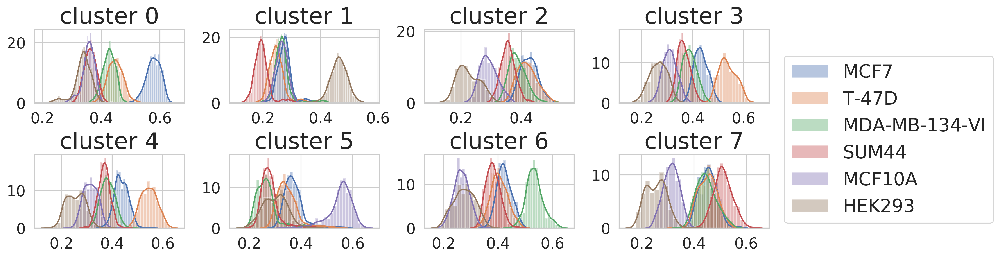

In [49]:
sns.set(context='notebook', style='whitegrid', palette='deep', font='sans-serif', font_scale=1.5, color_codes=True)

nplots = len(set(adata.obs['louvain']))
ncols = 4
nrows = ceil(nplots/ncols)

fig, axes = plt.subplots(ncols=ncols, nrows=nrows, figsize=(ncols*3.6, nrows*2), dpi=300)
plt.subplots_adjust(wspace=0.3, hspace=0.7) # 
axes_list = axes.flatten()

for n, x in enumerate(range(len(set(adata.obs['louvain'])))):
    ax = axes_list[n] 
    cells = np.array(adata.obs[adata.obs['louvain']==str(x)].index) 
    for y in cells_s:
        
        dists = corr_df.loc[cells, y]
        sns.distplot(dists, label=y, ax=ax)
    ax.set_xlabel('')
    ax.set_title('cluster {}'.format(x), fontsize=25)
    if n == nplots-1:
        ax.legend(loc='center', bbox_to_anchor=(1.8, 1.2), fontsize=20)

plt.savefig('../Figure/Fig1/BulkPearsonCorr.pdf', bbox_inches='tight')

In [13]:
adata_ref_norm = sc.read('../data/scVelo/AL1_ref_norm.h5ad')
adata = sc.read('../data/scVelo/AL1.h5ad')

if np.all(adata_ref_norm.obs.index == adata.obs.index):
    adata_ref_norm.obsm = adata.obsm 

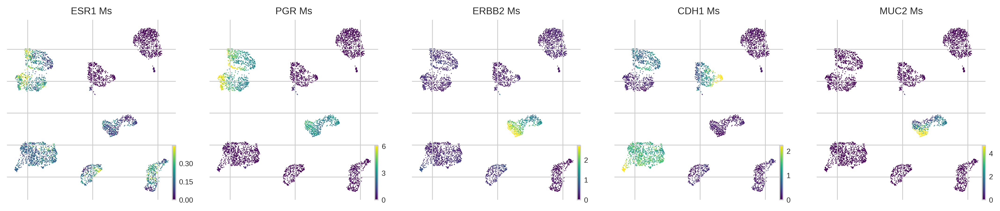

In [15]:
plt.style.use(['seaborn-whitegrid'])

scv.pl.scatter(adata_ref_norm, color=['ESR1','PGR','ERBB2','CDH1','MUC2'], 
               legend_loc='right margin', basis='umap', layer='Ms', fontsize=10, 
               ncols=5, size=3, figsize=(3.6,3.4),color_map='viridis', dpi=300)

In [27]:
map_dict = {'0':'MCF7', '1':'HEK293', '2':'BCK4', '3':'T47D WT', '4':'T47D KO', '5':'MCF10A', '6':'MM134', '7':'SUM44'}
CellType =[map_dict[x] for x in adata.obs['louvain']]
adata.obs['CellType'] = CellType

cat_type = CategoricalDtype(categories=['MCF7', 'T47D WT', 'T47D KO', 'MM134',"SUM44", "BCK4", "MCF10A", "HEK293"], ordered=True)
adata.obs['CellType'] = adata.obs['CellType'].astype(cat_type)

No handles with labels found to put in legend.


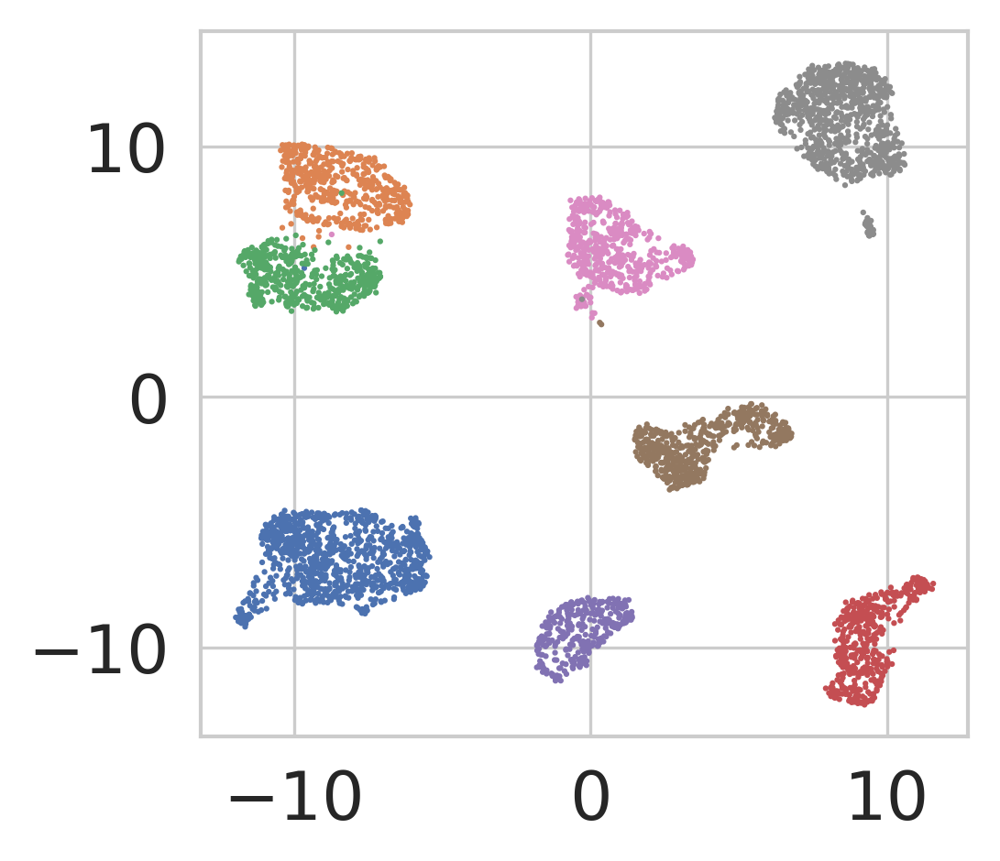

In [30]:
sns.set(context='paper', style='whitegrid', palette='deep', font='sans-serif', font_scale=2, color_codes=True)
mpl.rc('figure', dpi=300)

X = adata.obsm['X_umap']

CellTypeMapper = adata.obs['CellType']
types = np.array(adata.obs['CellType'].dtype.categories)
clist_types = sns.color_palette(palette='deep', desat=1)
row_colors = [clist_types[np.where(types==CellTypeMapper[bc])[0][0]] for bc in adata.obs.index]

fig = plt.figure(figsize=(3.6,3.4))
plt.scatter(X[:,0], X[:,1], color=row_colors, s=.5)
plt.legend()
plt.savefig('../Figure/Fig1/Umap.pdf')

In [32]:
adata_ref_norm.obs['CellType'] = adata.obs['CellType']

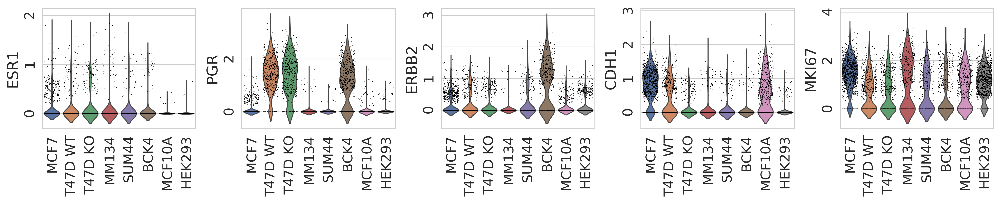

In [33]:
mpl.rc('figure', dpi=300, figsize=(4,3))
sns.set(context='paper', style='whitegrid', palette='deep', font='sans-serif', 
font_scale=2, color_codes=True)

sc.pl.violin(adata_ref_norm, ['ESR1','PGR','ERBB2','CDH1','MKI67'], groupby='CellType', 
             jitter=0.4, dpi=300, rotation=90)

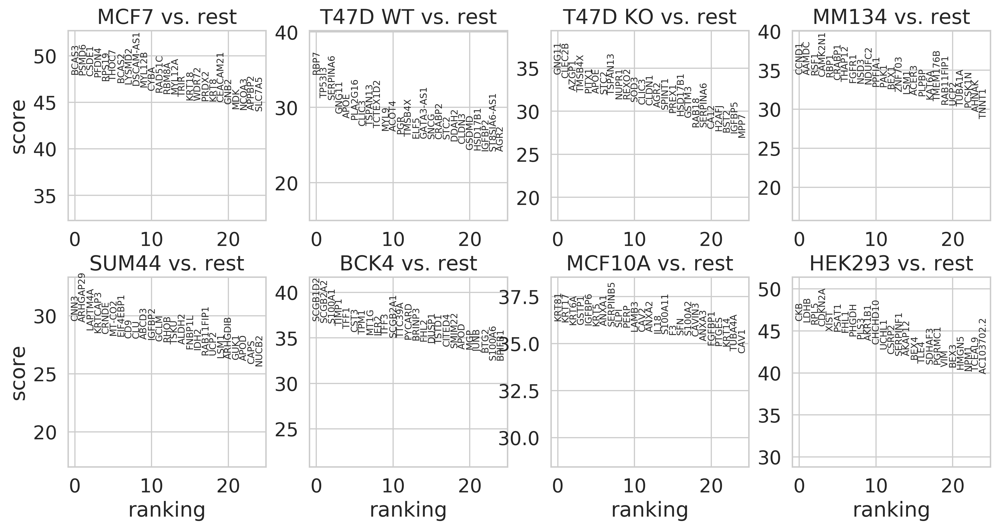

In [44]:
sc.tl.rank_genes_groups(adata, 'CellType', method='wilcoxon')
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

In [46]:
adata.write('../data/scVelo/AL1.h5ad')

Index(['MCF7', 'T47D WT', 'T47D KO', 'MM134', 'SUM44', 'BCK4', 'MCF10A',
       'HEK293'],
      dtype='object')


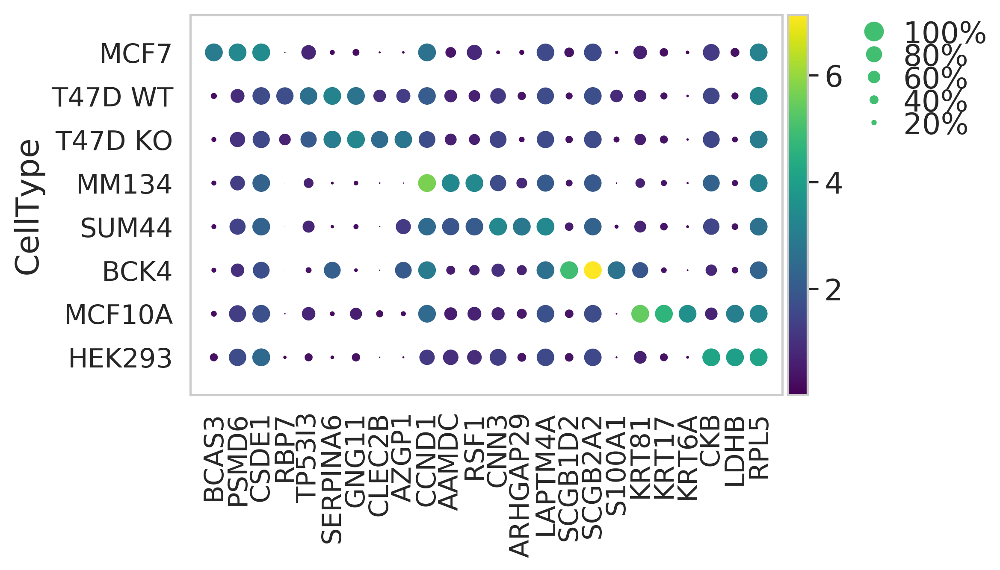

GridSpec(2, 5, height_ratios=[0, 10.5], width_ratios=[6.05, 0, 0.2, 0.5, 0.25])

In [45]:
sns.set(context='notebook', style='whitegrid', palette='deep', font='sans-serif', font_scale=1.5, color_codes=True)
mpl.rc('figure', dpi=300, figsize=(3.6,3.5)) # will have replicated DEGs

DEgDict = gather_degs(adata)
Markers_p = []
for cell in DEgDict.keys():
    Markers = list(DEgDict[cell].index)[:3]
#     if cell == 'MCF7':
#         Markers += ['CDH1']
    Markers_p.extend(Markers)
sc.pl.dotplot(adata, Markers_p, groupby='CellType', figsize=(7,4),
              dendrogram=False, color_map='viridis', save='DEGs.pdf')

(4614, 3000) (4614, 30)


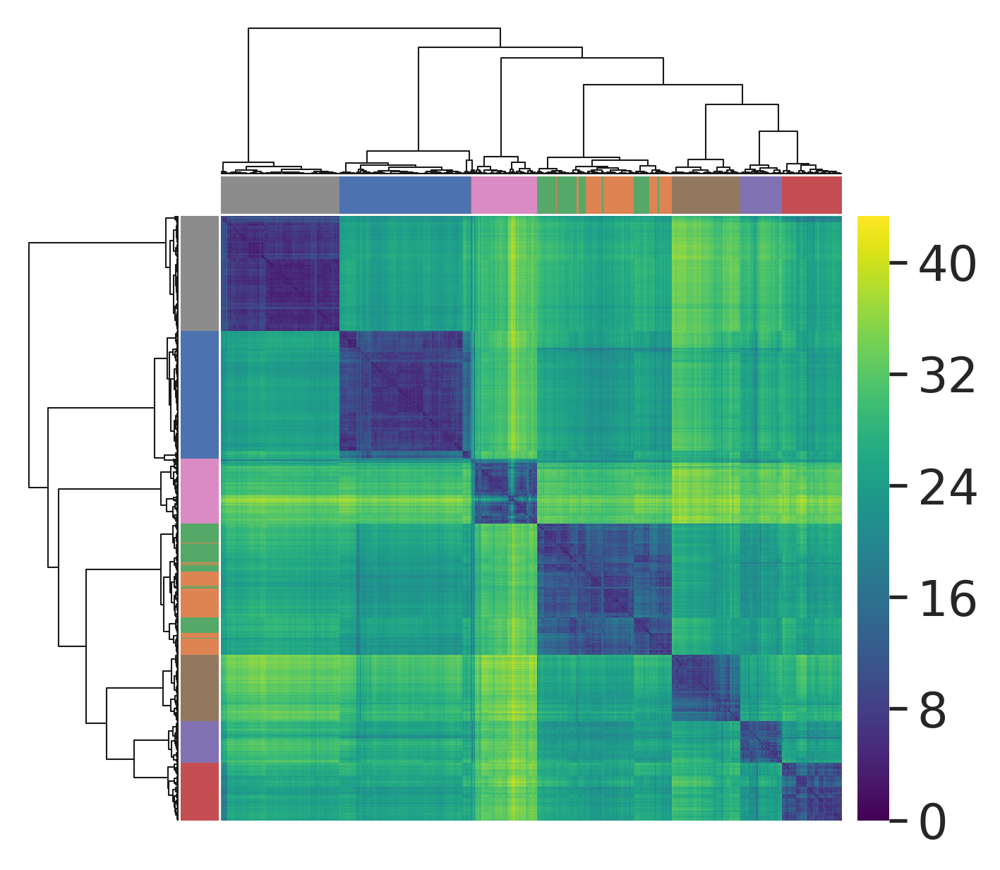

In [50]:
from scipy.spatial.distance import pdist, squareform
X = np.array(adata.X.todense())
Y = adata.obsm['X_pca']
print(X.shape, Y.shape)

D = squareform(pdist(Y, metric='euclidean')) 

# col colors (comparing different clusters from different data modality)
cellTypes = np.array(adata.obs['CellType'].dtype.categories)
cellTypes_colors = sns.color_palette(palette='deep', desat=1)
col_colors_2 = [cellTypes_colors[np.where(cellTypes==c)[0][0]] for c in adata.obs['CellType'].values]

## used zscore
g = sns.clustermap(D, figsize=(5,5), method='ward', metric='euclidean', cmap='viridis',
                   col_colors=[col_colors_2], row_colors=[col_colors_2],
                  linewidths=0)

g.ax_heatmap.set_xticks([])
g.ax_heatmap.set_xticklabels('')

g.ax_heatmap.set_yticks([])
g.ax_heatmap.set_yticklabels('')

cbar = g.cax
x0,y0,x1,y1 = np.array(g.ax_heatmap.get_position()).flatten()
cbar.set_position([x1+0.015, y0, 0.03, y1-y0])  

plt.savefig('../Figure/Fig1/EucHeatmap.png', dpi=300)

In [32]:
# adata_ref_norm = sc.read('../data/scVelo/AL1_ref_norm.h5ad')
# import scanpy as sc 
adata = sc.read('../data/scVelo/AL1.h5ad')

In [33]:
from scipy.spatial.distance import pdist, squareform
CellTypes = ['MCF7', 'T47D WT', 'T47D KO', 'MM134',"SUM44", "BCK4", "MCF10A", "HEK293"]

EucDist = []
cellnames = []
for cell in CellTypes:
    tmp = adata[adata.obs['CellType']==cell]
    Y = tmp.obsm['X_pca']    
    P = list(pdist(Y, metric='euclidean')) # not redundant
    names = [cell] * len(P)
     
    cellnames.extend(names)
    EucDist.extend(P)

In [34]:
from scipy.stats import mannwhitneyu
import numpy as np

plist = []
for cell in ['MCF7', 'T47D WT', 'T47D KO', 'MM134',"SUM44", "BCK4", "MCF10A"]:
    x = np.array(EucDist)[np.array(cellnames)==cell]
    y = np.array(EucDist)[np.array(cellnames)=='HEK293']
    _, p = mannwhitneyu(x, y)
    plist.append(p)
    
from statsmodels.stats.multitest import multipletests
FDRs = multipletests(plist)

FDRs

(array([ True,  True,  True,  True,  True,  True,  True]),
 array([0., 0., 0., 0., 0., 0., 0.]),
 0.007300831979014655,
 0.0071428571428571435)

In [35]:
from scipy.stats import mannwhitneyu
import numpy as np

plist = []
for cell in ['MCF7', 'T47D WT', 'T47D KO', 'MM134',"SUM44", "BCK4", "MCF10A"]:
    x = np.array(EucDist)[np.array(cellnames)==cell]
    y = np.array(EucDist)[np.array(cellnames)=='MCF10A']
    _, p = mannwhitneyu(x, y)
    plist.append(p)
    
from statsmodels.stats.multitest import multipletests
FDRs = multipletests(plist)

FDRs

(array([ True,  True,  True,  True,  True,  True, False]),
 array([0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.49999999]),
 0.007300831979014655,
 0.0071428571428571435)

In [5]:
plot_adata = anndata.AnnData(np.array(EucDist).reshape(len(EucDist),1), obs=cellnames, var=['Dist'])

plot_adata.obs.columns=['CellType']
cat_type = CategoricalDtype(categories=CellTypes, ordered=True)
plot_adata.obs['CellType'] = plot_adata.obs['CellType'].astype(cat_type)

plot_adata.obs['Dist'] = plot_adata.X

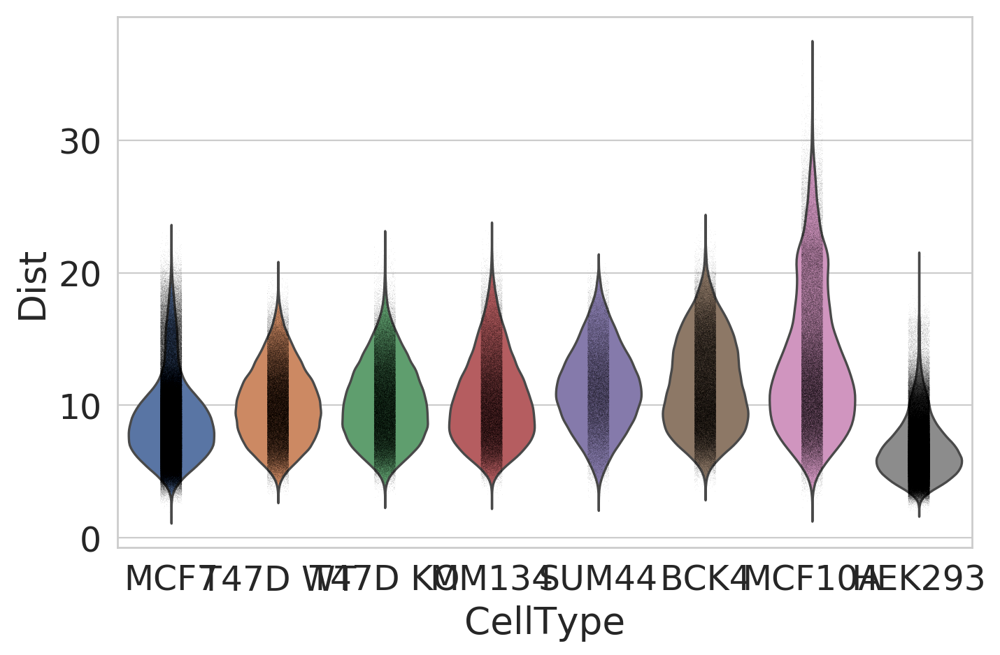

In [7]:
scv.settings.set_figure_params('scvelo')
sns.set(context='paper', style='whitegrid', palette='deep', font='sans-serif', font_scale=2, color_codes=True)

sc.pl.violin(plot_adata, keys='Dist', groupby='CellType', jitter=True, size=.1, save='IntraEucDist.png', dpi=300)

In [8]:
!mv figures/* ../Figure/Fig1 

# Quality control

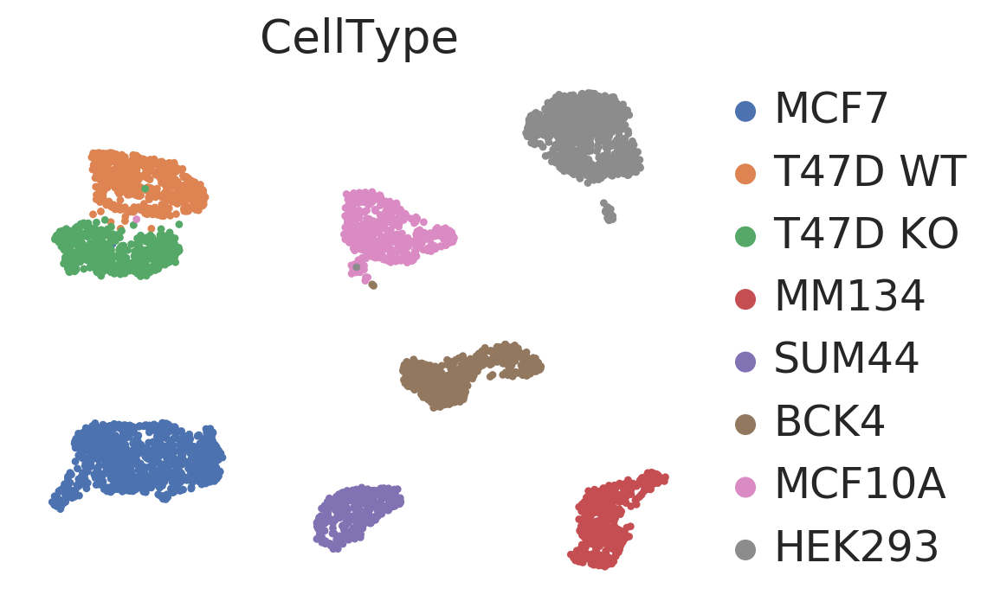

In [11]:
adata_ref_raw = sc.read('../data/scVelo/AL1_ref_raw.h5ad')
adata = sc.read('../data/scVelo/AL1.h5ad')
scv.pl.scatter(adata, color=['CellType'], 
               legend_loc='right margin', basis='umap', 
               figsize=(5,4), size=40, dpi=100)


adata.uns['louvain_colors'] = [tuple(x) for x in adata.uns['louvain_colors']]
adata.uns['CellType_colors'] = [tuple(x) for x in adata.uns['CellType_colors']]

In [14]:
plt.style.use(['NaturePub'])

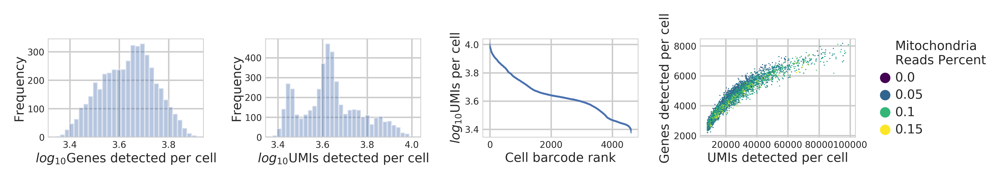

In [16]:
# from math import ceil
nplots = 3
ncols = 4
nrows = ceil(nplots/ncols)

fig, axes = plt.subplots(ncols=ncols, nrows=nrows, figsize=(8, 1))
plt.subplots_adjust(wspace=0.4, hspace=0.5) 
axes_list = axes.flatten()

# genes
ax = axes_list[0]
logGenes = np.log10(adata.obs['n_genes'].values)
MAD = np.median(abs(logGenes-np.median(logGenes)))

vmin = np.median(logGenes) - 3*MAD
vmax = np.median(logGenes) + 3*MAD

sns.distplot(logGenes, kde=False, ax=ax)
ax.set_ylabel('Frequency')
ax.set_xlabel('$log_{10}$Genes detected per cell')

# UMIs
ax = axes_list[1]
logCts = np.log10(adata.obs['n_counts'].values)
MAD = np.median(abs(logCts-np.median(logCts)))

vmin = np.median(logCts) - 3*MAD
vmax = np.median(logCts) + 3*MAD

sns.distplot(logCts, kde=False, ax=ax)
ax.set_ylabel('Frequency')
ax.set_xlabel('$log_{10}$UMIs detected per cell')

# Ranked counts 
ax = axes_list[2]
nCounts = adata.obs['n_counts'].values
x = np.sort(nCounts)[::-1]
ax.scatter([i for i in range(len(x))], np.log10(x), s=.01)
ax.set_ylabel('$log_{10}$UMIs per cell')
ax.set_xlabel('Cell barcode rank')

# genes ~ counts
ax = axes_list[3]
df_p = adata_ref_raw.obs.loc[:,['n_counts','n_genes','percent_mito']]
df_p.columns = ['UMIs detected per cell', 'Genes detected per cell', 'Mitochondria\nReads Percent']

sns.scatterplot(data=df_p, x='UMIs detected per cell',y='Genes detected per cell',hue='Mitochondria\nReads Percent',
               linewidth=0, palette='viridis',s=0.4, ax=ax)
ax.legend(loc='center', bbox_to_anchor=(1.5, 0.5))

plt.savefig('../Figure/Fig1/QC.pdf')

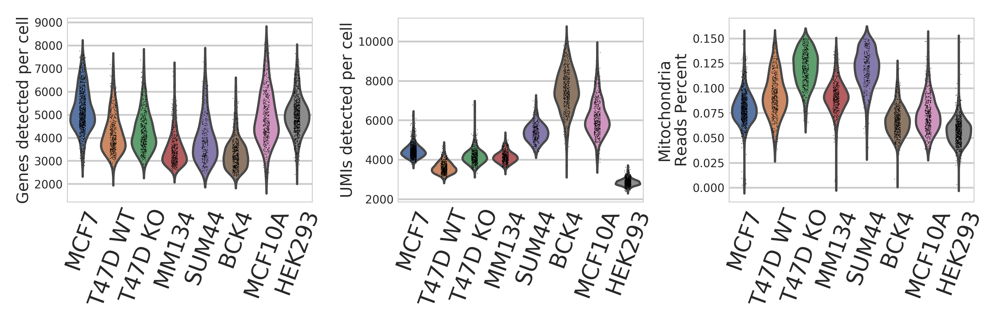

In [23]:
# plt.style.use(['NaturePub',])
CellTypes = ['MCF7', 'T47D WT', 'T47D KO', 'MM134', 'SUM44', 'BCK4',  'MCF10A', 'HEK293']
nplots = 3
ncols = 3
nrows = ceil(nplots/ncols)

fig, axes = plt.subplots(ncols=ncols, nrows=nrows, figsize=(7.2, 1.5))
plt.subplots_adjust(wspace=0.35, hspace=0.5) 
axes_list = axes.flatten()

ax = axes_list[0]
sc.pl.violin(adata, ['n_genes'], groupby='CellType',rotation=0, jitter=True, size=0.3, show=False,ax=ax)
ax.set_ylabel('Genes detected per cell')
ax.set_xticklabels(CellTypes, rotation=70, fontsize=10)

ax = axes_list[1]
sc.pl.violin(adata, ['n_counts'], groupby='CellType',rotation=0, jitter=True, size=0.3, show=False,ax=ax)
ax.set_ylabel('UMIs detected per cell')
ax.set_xticklabels(CellTypes, rotation=70, fontsize=10)

ax = axes_list[2]
sc.pl.violin(adata, ['percent_mito'], groupby='CellType',rotation=0, jitter=True, size=0.3, show=False,ax=ax)
ax.set_ylabel('Mitochondria\nReads Percent')
ax.set_xticklabels(CellTypes, rotation=70, fontsize=10)

plt.savefig('../Figure/Fig1/violin.pdf')

saving figure to file ./figures/scvelo_umapQC.pdf


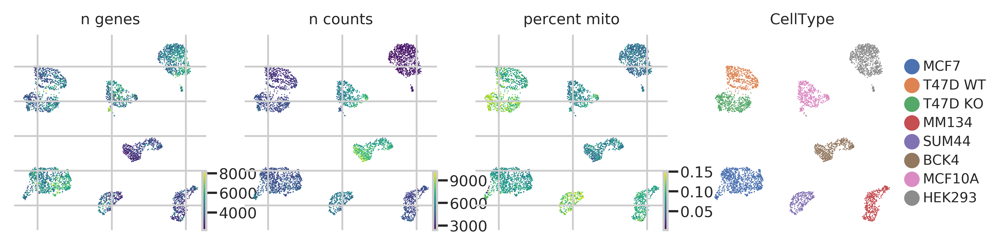

In [33]:
plt.style.use(['NaturePub'])
sns.set(context='notebook', style='whitegrid', palette='deep', font='sans-serif', font_scale=.7, color_codes=True)

scv.pl.scatter(adata, color=['n_genes', 'n_counts', 'percent_mito', 'CellType'], 
               legend_loc='right margin', basis='umap', ncols=4, size=1.5, figsize=(2.2,2),color_map='viridis',
               save='umapQC.pdf')

In [34]:
!mv figures/* ../Figure/Fig1 

# PAM50
- The stanford PAM50 paper => Refer to `../scripts/pam50_2015/`, which contains everything.

## Using cell line centroid

In [1]:
pwd

'/Users/chelseachen/Box/WCRC/Lee-Oesterreich-lab-personnel/Current/Chelsea/projects/CellLines/codes'

In [3]:
centroids = pd.read_csv('../data/PAM50/Centroids_pam50.txt', sep='\t', header=0, index_col=0)
quantiles = pd.read_csv('../data/PAM50/Pam50_subpopulation_specific_gene_quantile.csv', header=0, index_col=0)

In [4]:
bulk = pd.read_csv('../data/BulkCellLines/brcaLines.tmmNorm.log2cpm.shiny.csv', index_col=0).T
bulk.index = [x.split('_')[0] for x in bulk.index]
bulk = bulk.loc[~bulk.index.duplicated(keep='first')]

print(bulk.shape)
bulk.head(3)

(55135, 97)


,184A1,184B5,21MT1,21MT2,21NT,21PT,600MPE,AU565,BT-20,BT-474,...,SUM44,SUM52PE,SW527,T-47D,UACC-812,UACC-893,UACC3199,ZR-75-1,ZR-75-30,ZR75B
TSPAN6,4.36053,4.54201,2.44503,3.95496,3.43921,3.18677,5.00897,4.85874,4.50935,3.53464,...,3.86719,4.72755,6.29563,4.65752,3.84224,5.26609,5.7873,3.52879,5.08233,0.618774
TNMD,0,0,0,0.0595976,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
DPM1,5.73251,5.00531,4.17382,4.64615,4.60714,4.32513,4.88377,6.43761,6.40824,6.99794,...,5.57817,4.23277,6.04332,6.22575,7.39884,5.68286,5.59626,6.18891,5.65176,4.76371


In [6]:
pam50_genes = [g for g in centroids.index if g in bulk.index]
cellLine_centroid = pd.DataFrame(bulk.loc[pam50_genes, ['MDA-MB-231','SK-BR-3','MCF7','BT-474']].values, index=pam50_genes, columns=['Basal', 'Her2', 'LumA', 'LumB'])

print(f'{len(pam50_genes)} overlapped genes')

47 overlapped genes


In [87]:
adata_ref_norm = sc.read('../data/scVelo/AL1_ref_norm.h5ad')
adata = sc.read('../data/scVelo/AL1.h5ad')
adata_ref_norm.obs['CellType'] = adata.obs['CellType']
adata_ref_norm.write('../data/scVelo/AL1_ref_norm.h5ad')

pam50 = adata_ref_norm[:, np.array([x for x in cellLine_centroid.index if x in adata_ref_norm.var.index])]

In [88]:
subtype = 'ER_pos'
genes_sel = pam50.var.index

X = pam50.X.toarray().T # gene x cell
centroids_sel = cellLine_centroid.loc[genes_sel,:] # changed to cellLine centroid
quantiles_sel = quantiles.loc[genes_sel, subtype].values

X_cen = [np.quantile(X[i,:], quantiles_sel[i]) for i in range(len(quantiles_sel))]
X_centered = X - np.reshape(np.array(X_cen), (len(quantiles_sel),1))

In [89]:
from scipy.stats import spearmanr
def pam_corr(x_centered, centroids_sel=centroids_sel):
    # df; array
    assert centroids_sel.shape[0] == X_centered.shape[0]
    x = x_centered.flatten()
    res = [spearmanr(x, centroids_sel.values[i])[0] for i in range(centroids_sel.shape[1])]
    return np.array(res)

corrs = np.empty((centroids_sel.shape[1], X_centered.shape[1]))
for j in range(X_centered.shape[1]):
    for i in range(centroids_sel.shape[1]):
        rho = spearmanr(X_centered[:,j].flatten(), centroids_sel.values[:,i].flatten())[0]
        corrs[i,j] = rho

In [90]:
corr_df = pd.DataFrame(corrs, index=centroids_sel.columns, columns=pam50.obs.index)
corr_df

index,AL1:AAAGTGAGTCATAGTCx,AL1:AAAGAACGTAACAAGTx,AL1:AAACGCTGTAGACACGx,AL1:AAAGGGCCAGCAATTCx,AL1:AACAAAGGTTGAATCCx,AL1:AAAGTGATCCCGAATAx,AL1:AAACGAAAGAGGATCCx,AL1:AAACGCTGTGCCCGTAx,AL1:AAAGTCCAGACATCCTx,AL1:AAAGGGCAGCTGCCTGx,...,AL1:TTTGTTGTCGCCGTGAx,AL1:TTTGTTGCATCATTTCx,AL1:TTTGACTTCGTGTGATx,AL1:TTTGTTGCAGGGTTGAx,AL1:TTTGATCAGGTTGGTGx,AL1:TTTGATCGTTGCACGCx,AL1:TTTGTTGCATCAGCGCx,AL1:TTTGGTTGTGATACAAx,AL1:TTTGACTGTTAGTTCGx,AL1:TTTGTTGGTGATTAGAx
Basal,-0.482810,-0.425029,0.040646,-0.115549,-0.027324,-0.583119,-0.027400,-0.629348,0.044690,-0.086458,...,0.121297,-0.292319,-0.242427,0.021057,0.286471,-0.338191,-0.495956,-0.485429,-0.493572,-0.672608
Her2,-0.160412,-0.180553,0.047934,0.047472,-0.012398,-0.191298,-0.143227,-0.347865,-0.100328,-0.072049,...,0.039076,-0.162584,-0.128180,-0.138189,0.193228,-0.224037,-0.211055,-0.234422,-0.501510,-0.454619
LumA,-0.019386,-0.289991,0.101677,0.280802,0.058862,-0.261144,-0.112595,-0.134847,-0.066528,0.037276,...,0.196342,-0.141420,0.001212,-0.312160,0.214664,-0.068946,-0.035682,-0.007293,-0.439145,-0.339023
LumB,-0.085113,-0.215554,0.234751,0.136680,0.006620,-0.108846,-0.143593,-0.124762,0.012563,0.016553,...,0.178624,-0.061666,-0.094499,-0.207343,0.161204,0.005696,-0.171195,-0.045285,-0.481724,-0.387452


In [91]:
corr_df.to_csv('../data/PAM50/PAM50_AL1_CellLineCentroid.csv')

In [92]:
sns.set(context='notebook', style='whitegrid', palette='deep', font='sans-serif', font_scale=2, color_codes=True)
mpl.rc('figure', dpi=300)

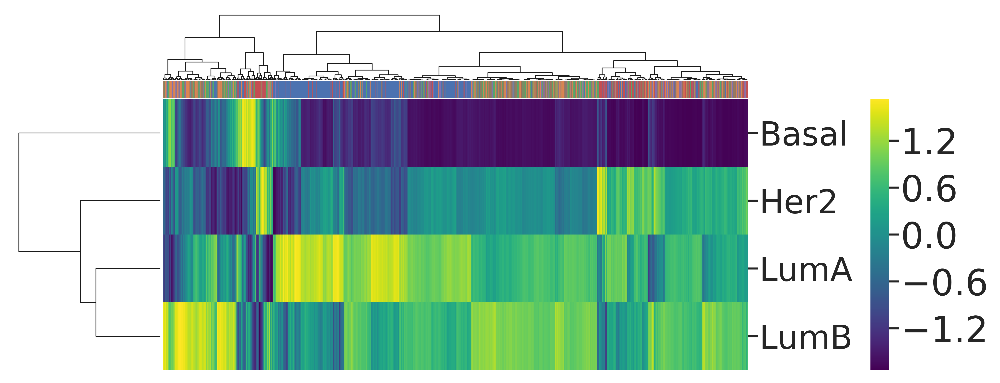

In [93]:
pam50_cancer = pam50[pam50.obs['CellType'].isin(['MCF7', 'T47D WT', 'T47D KO', 'MM134', 'SUM44', 'BCK4'])]

cellTypes = np.array(pam50_cancer.obs['CellType'].dtype.categories)
cellTypes_colors = sns.color_palette(palette='deep', desat=1)
col_colors = [cellTypes_colors[np.where(cellTypes==c)[0][0]] for c in pam50_cancer.obs['CellType'].values]
corr_df_sel = corr_df.loc[:,pam50_cancer.obs.index]

X = zscore(corr_df_sel, axis=0)
# X = corr_df_sel.values
X_df = pd.DataFrame(X, index=corr_df_sel.index, columns=corr_df_sel.columns)
g = sns.clustermap(X_df, method='ward', metric='euclidean', 
                   col_colors=[col_colors],
                   cmap='viridis', 
                   figsize=(8,4), linewidth=0)

g.ax_heatmap.set_xlabel('')
g.ax_heatmap.set_xticks([])
g.ax_heatmap.set_xticklabels('')

ylabels = X_df.index[np.array(g.dendrogram_row.reordered_ind)]
g.ax_heatmap.set_yticks([x+0.5 for x in range(len(ylabels))])
g.ax_heatmap.set_yticklabels(ylabels, rotation=0, fontsize=20)


cbar = g.cax
x0,y0,x1,y1 = np.array(g.ax_heatmap.get_position()).flatten()
cbar.set_position([x1+0.13, y0, 0.02, y1-y0])

In [94]:
g.savefig('../Figure/Fig1/PAM50Heatmap_CellLineRef.png', dpi=300, bbox_inches='tight')

In [95]:
PAM50 = [corr_df_sel.index[np.argmax(corr_df_sel.values[:,j])] for j in range(corr_df_sel.shape[1])]
pam50_cancer.obs['PAM50'] = np.array(PAM50)

Trying to set attribute `.obs` of view, making a copy.


In [96]:
nobs = pam50_cancer.obs[['CellType','PAM50']]
tbl = nobs.groupby(['CellType', 'PAM50']).size().unstack().loc[:,['LumA','LumB','Her2','Basal','Normal']].fillna(0)
tbl

PAM50,LumA,LumB,Her2,Basal,Normal
CellType,,,,,
MCF7,862,78,18,19,0.0
T47D WT,61,385,36,27,0.0
T47D KO,66,376,25,24,0.0
MM134,159,85,146,49,0.0
SUM44,78,196,32,8,0.0
BCK4,110,375,23,4,0.0


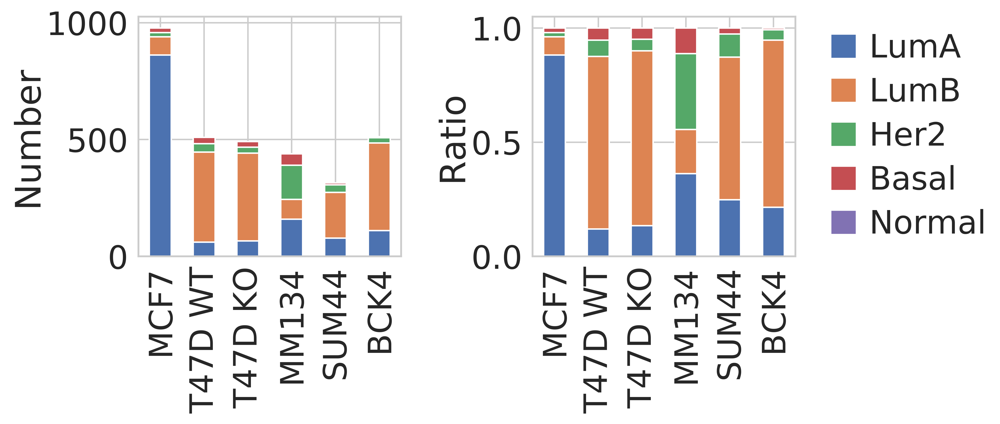

In [97]:
sns.set(context='notebook', style='whitegrid', palette='deep', font='sans-serif', font_scale=2, color_codes=True)

fig, axes = plt.subplots(ncols=2, figsize=(8,3))
plt.subplots_adjust(wspace=0.5, hspace=0.5)
axes_list = axes.flatten()

tbl.plot(kind='bar', stacked=True, ax=axes_list[0])
axes_list[0].get_legend().remove()
axes_list[0].set_ylabel('Number')
axes_list[0].set_xlabel('')

np.divide(tbl, np.sum(tbl.values, axis=1, keepdims=True)).plot(kind='bar', stacked=True, ax=axes_list[1])
axes_list[1].legend(loc='right', bbox_to_anchor=(1.8, 0.5))
axes_list[1].set_ylabel('Ratio')
axes_list[1].set_xlabel('')

plt.savefig('../Figure/Fig1/PAM50Comp_CellLineRef.png', dpi=300, bbox_inches='tight')

## Using original tumor centroid

In [98]:
subtype = 'ER_pos'
genes_sel = pam50.var.index

X = pam50.X.toarray().T # gene x cell
centroids_sel = centroids.loc[genes_sel,['Basal','Her2','LumA','LumB']] # Only choose four subtypes
quantiles_sel = quantiles.loc[genes_sel, subtype].values

X_cen = [np.quantile(X[i,:], quantiles_sel[i]) for i in range(len(quantiles_sel))]
X_centered = X - np.reshape(np.array(X_cen), (len(quantiles_sel),1))

In [99]:
from scipy.stats import spearmanr
def pam_corr(x_centered, centroids_sel=centroids_sel):
    # df; array
    assert centroids_sel.shape[0] == X_centered.shape[0]
    x = x_centered.flatten()
    res = [spearmanr(x, centroids_sel.values[i])[0] for i in range(centroids_sel.shape[1])]
    return np.array(res)

corrs = np.empty((centroids_sel.shape[1], X_centered.shape[1]))
for j in range(X_centered.shape[1]):
    for i in range(centroids_sel.shape[1]):
        rho = spearmanr(X_centered[:,j].flatten(), centroids_sel.values[:,i].flatten())[0]
        corrs[i,j] = rho

In [100]:
corr_df = pd.DataFrame(corrs, index=centroids_sel.columns, columns=pam50.obs.index)
corr_df

index,AL1:AAAGTGAGTCATAGTCx,AL1:AAAGAACGTAACAAGTx,AL1:AAACGCTGTAGACACGx,AL1:AAAGGGCCAGCAATTCx,AL1:AACAAAGGTTGAATCCx,AL1:AAAGTGATCCCGAATAx,AL1:AAACGAAAGAGGATCCx,AL1:AAACGCTGTGCCCGTAx,AL1:AAAGTCCAGACATCCTx,AL1:AAAGGGCAGCTGCCTGx,...,AL1:TTTGTTGTCGCCGTGAx,AL1:TTTGTTGCATCATTTCx,AL1:TTTGACTTCGTGTGATx,AL1:TTTGTTGCAGGGTTGAx,AL1:TTTGATCAGGTTGGTGx,AL1:TTTGATCGTTGCACGCx,AL1:TTTGTTGCATCAGCGCx,AL1:TTTGGTTGTGATACAAx,AL1:TTTGACTGTTAGTTCGx,AL1:TTTGTTGGTGATTAGAx
Basal,-0.524427,-0.359690,-0.162821,-0.488536,-0.374166,-0.504171,0.159704,-0.519391,0.099610,-0.107299,...,-0.019867,-0.291963,-0.361884,0.141060,-0.159759,-0.376045,-0.436649,-0.587878,-0.114922,-0.361761
Her2,-0.235347,0.098687,0.005155,-0.106417,-0.099665,0.007007,0.122295,-0.195178,-0.033682,-0.211739,...,0.163005,0.088111,-0.115580,-0.148837,-0.075305,0.093151,-0.305860,-0.012703,-0.308038,-0.182803
LumA,0.702164,0.406967,0.112162,0.493511,0.331074,0.659498,-0.169712,0.688388,-0.034998,0.304807,...,-0.081563,0.285619,0.387932,-0.048097,-0.008126,0.465992,0.637346,0.732201,0.462294,0.654841
LumB,-0.151264,0.052649,0.113643,0.225068,0.184044,-0.005839,-0.001831,-0.164243,-0.133650,-0.183694,...,0.221051,0.034153,-0.021081,-0.061736,0.202558,0.148330,-0.142480,0.075161,-0.403767,-0.207503


In [101]:
corr_df.to_csv('../data/PAM50/PAM50_AL1_ERposTumorCentroid.csv')

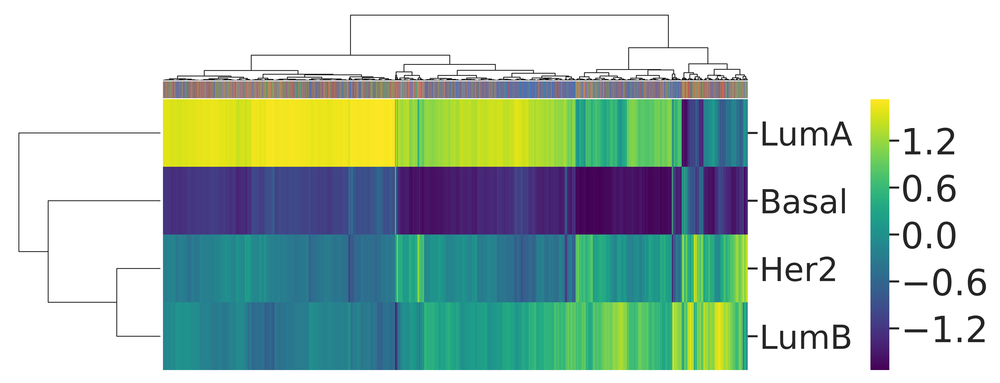

In [102]:
pam50_cancer = pam50[pam50.obs['CellType'].isin(['MCF7', 'T47D WT', 'T47D KO', 'MM134', 'SUM44', 'BCK4'])]

cellTypes = np.array(pam50_cancer.obs['CellType'].dtype.categories)
cellTypes_colors = sns.color_palette(palette='deep', desat=1)
col_colors = [cellTypes_colors[np.where(cellTypes==c)[0][0]] for c in pam50_cancer.obs['CellType'].values]
corr_df_sel = corr_df.loc[:,pam50_cancer.obs.index]

X = zscore(corr_df_sel, axis=0)
# X = corr_df_sel.values
X_df = pd.DataFrame(X, index=corr_df_sel.index, columns=corr_df_sel.columns)
g = sns.clustermap(X_df, method='ward', metric='euclidean', 
                   col_colors=[col_colors],
                   cmap='viridis', 
                   figsize=(8,4), linewidth=0)

g.ax_heatmap.set_xlabel('')
g.ax_heatmap.set_xticks([])
g.ax_heatmap.set_xticklabels('')

ylabels = X_df.index[np.array(g.dendrogram_row.reordered_ind)]
g.ax_heatmap.set_yticks([x+0.5 for x in range(len(ylabels))])
g.ax_heatmap.set_yticklabels(ylabels, rotation=0, fontsize=20)


cbar = g.cax
x0,y0,x1,y1 = np.array(g.ax_heatmap.get_position()).flatten()
cbar.set_position([x1+0.13, y0, 0.02, y1-y0])

In [103]:
g.savefig('../Figure/Fig1/PAM50Heatmap_Tumor.png', dpi=300, bbox_inches='tight')

In [104]:
PAM50 = [corr_df_sel.index[np.argmax(corr_df_sel.values[:,j])] for j in range(corr_df_sel.shape[1])]
pam50_cancer.obs['PAM50'] = np.array(PAM50)

Trying to set attribute `.obs` of view, making a copy.


In [105]:
nobs = pam50_cancer.obs[['CellType','PAM50']]
tbl = nobs.groupby(['CellType', 'PAM50']).size().unstack().loc[:,['LumA','LumB','Her2','Basal','Normal']].fillna(0)
tbl

PAM50,LumA,LumB,Her2,Basal,Normal
CellType,,,,,
MCF7,796.0,177.0,3.0,1.0,0.0
T47D WT,351.0,87.0,69.0,2.0,0.0
T47D KO,359.0,71.0,61.0,0.0,0.0
MM134,305.0,116.0,18.0,0.0,0.0
SUM44,247.0,37.0,29.0,1.0,0.0
BCK4,441.0,69.0,2.0,0.0,0.0


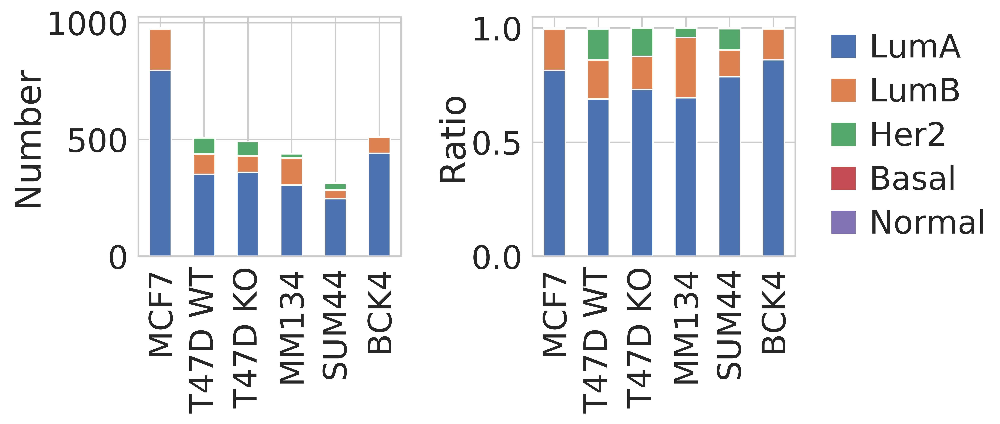

In [106]:
sns.set(context='notebook', style='whitegrid', palette='deep', font='sans-serif', font_scale=2, color_codes=True)

fig, axes = plt.subplots(ncols=2, figsize=(8,3))
plt.subplots_adjust(wspace=0.5, hspace=0.5)
axes_list = axes.flatten()

tbl.plot(kind='bar', stacked=True, ax=axes_list[0])
axes_list[0].get_legend().remove()
axes_list[0].set_ylabel('Number')
axes_list[0].set_xlabel('')

np.divide(tbl, np.sum(tbl.values, axis=1, keepdims=True)).plot(kind='bar', stacked=True, ax=axes_list[1])
axes_list[1].legend(loc='right', bbox_to_anchor=(1.8, 0.5))
axes_list[1].set_ylabel('Ratio')
axes_list[1].set_xlabel('')

plt.savefig('../Figure/Fig1/PAM50Comp_Tumor.png', dpi=300, bbox_inches='tight')

# Cell Cycle

## Prep

In [1]:
from utils import *

/bgfs/alee/chelsea/apps/anaconda3/envs/py37/lib/python3.7/site-packages/dask/config.py:161: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  data = yaml.load(f.read()) or {}


In [2]:
adata_m = sc.read('../data/scVelo/AL1.h5ad')
adata_ref_raw = sc.read('../data/scVelo/AL1_ref_raw.h5ad')
adata_ref_raw.obs = adata_m.obs
print(adata_m, adata_ref_raw, sep='\n\n')

AnnData object with n_obs × n_vars = 4614 × 3000 
    obs: 'Clusters', '_X', '_Y', 'doublet_bln', 'doublet_score', 'percent_mito', 'n_counts', 'n_genes', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'louvain', 'CellType', 'phase'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'means', 'dispersions', 'dispersions_norm'
    uns: 'louvain', 'louvain_colors', 'neighbors', 'pca', 'rank_genes_groups'
    obsm: 'X_pca', 'X_tsne', 'X_umap'
    varm: 'PCs'
    layers: 'Ms', 'Mu', 'ambiguous', 'matrix', 'spliced', 'unspliced'

AnnData object with n_obs × n_vars = 4614 × 33538 
    obs: 'Clusters', '_X', '_Y', 'doublet_bln', 'doublet_score', 'percent_mito', 'n_counts', 'n_genes', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'louvain', 'CellType', 'phase'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced'


In [3]:
cycle_genes_whitefield = pd.read_csv('../data/CellCycle/CellCycleGeneList_1134.txt', sep='\t', header=0)

cycle_genes_whitefield_dict = {}
for phase in set(cycle_genes_whitefield['PHASE']):
    sel = cycle_genes_whitefield[cycle_genes_whitefield['PHASE']==phase]
    names = [x.split(' ')[0] for x in sel['NAME']]
    names = list(set([n for n in names if n!='']))
    print(phase, ': %d genes'%len(names), sep='\t')
    cycle_genes_whitefield_dict[phase] = names
    
print('\n\nTotal genes:', sum(len(x) for _,x in cycle_genes_whitefield_dict.items()))

*S phase	: 7 genes
G2	: 164 genes
M/G1	: 138 genes
G1/S	: 130 genes
G2/M	: 200 genes
S phase	: 127 genes


Total genes: 766


## Calc highly correlated genes

In [4]:
n_top_genes = 5000 
n_top_cycle_genes = 100
c

cycle_genes_dict = cycle_genes_whitefield_dict
phases = [x for x in cycle_genes_dict.keys() if x!='*S phase']
phases = ['M/G1', 'G1/S', 'S phase', 'G2', 'G2/M']
print(phases)

['M/G1', 'G1/S', 'S phase', 'G2', 'G2/M']


In [8]:
CellTypes = ['MCF7', 'T47D WT', 'T47D KO', 'MM134', 'SUM44', 'BCK4',  'MCF10A', 'HEK293']
Cell_dict = {}
Corr_dict = {}

for n, cell in enumerate(CellTypes):
    
    ### Re-processing for each cell 
    tmp = adata_ref_raw[adata_ref_raw.obs['CellType']==cell] 
    tmp.var_names_make_unique()
    
    scv.pp.filter_genes(tmp, min_cells=2)
    scv.pp.filter_genes_dispersion(tmp, flavor='seurat', n_top_genes=n_top_genes)
    scv.pp.normalize_per_cell(tmp, layers=['spliced', 'unspliced']) # 3 layers all been normalized by / cts
    scv.pp.log1p(tmp) # only tmp.X is log1p (loge(x+1))
    scv.pp.moments(tmp, n_pcs=30, n_neighbors=30, mode='connectivities', method='umap', use_rep=None)
    Cell_dict[cell] = tmp
    
    cts = pd.DataFrame(tmp.layers['Ms'], index=tmp.obs.index, columns=tmp.var.index)
    tmp_dict = {}
    
    for phase, genes in cycle_genes_dict.items():
        genes = np.array([g for g in genes if g in tmp.var.index])
        print(cell, phase, 'genes num:', len(genes), sep='\t')
        expr = cts.loc[:, genes].T # genes X cells (as cell is feature)
        # Pearson Corr
        dists = corr2_coeff(expr.values, np.mean(expr.values, axis=0, keepdims=True)).flatten()
        
        tmp_dict[phase] = pd.Series(data=dists, index=genes) 

    Corr_dict[cell] = tmp_dict

Filtered out 15912 genes that are detected in less than 2 cells (spliced).
Normalized count data: X, spliced, unspliced.
computing neighbors
    finished (0:00:00) --> added to `.uns['neighbors']`
    'distances', weighted adjacency matrix
    'connectivities', weighted adjacency matrix
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of spliced/unspliced abundances (adata.layers)
MCF7	*S phase	genes num:	0
MCF7	G2	genes num:	35
MCF7	M/G1	genes num:	26
MCF7	G1/S	genes num:	22
MCF7	G2/M	genes num:	53
MCF7	S phase	genes num:	22
Filtered out 18114 genes that are detected in less than 2 cells (spliced).
Normalized count data: X, spliced, unspliced.
computing neighbors
    finished (0:00:00) --> added to `.uns['neighbors']`
    'distances', weighted adjacency matrix
    'connectivities', weighted adjacency matrix
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of spliced/unspliced ab

In [10]:
fname = 'CellAdataDict'
f = open("../data/scVelo/%s.pkl"%(fname),"wb")
pickle.dump(Cell_dict,f)
f.close()

MCF7 G2 High Corr CycleGenes: 14
MCF7 M/G1 High Corr CycleGenes: 10
MCF7 G1/S High Corr CycleGenes: 9
MCF7 G2/M High Corr CycleGenes: 21


Trying to set attribute `.obs` of view, making a copy.


MCF7 S phase High Corr CycleGenes: 9
Skip filtering by dispersion since number of variables are less than `n_top_genes`



MCF7 G2 Variable High Corr CycleGenes: 14
MCF7 M/G1 Variable High Corr CycleGenes: 10
MCF7 G1/S Variable High Corr CycleGenes: 9
MCF7 G2/M Variable High Corr CycleGenes: 21
MCF7 S phase Variable High Corr CycleGenes: 9
recovering dynamics
    finished (0:00:12) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)
computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph
    finished (0:00:00) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing terminal states
    identified 0 region of root cells and 1 region of end points 
    finished (0:00:00) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)
computing lat

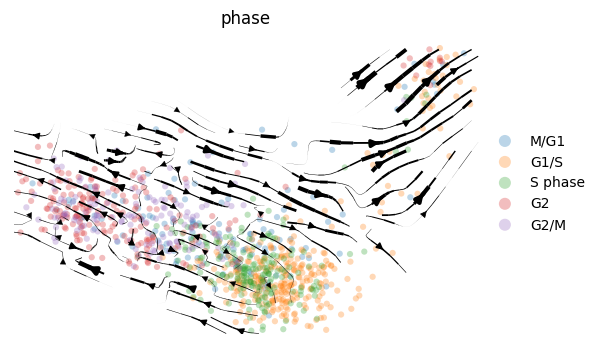

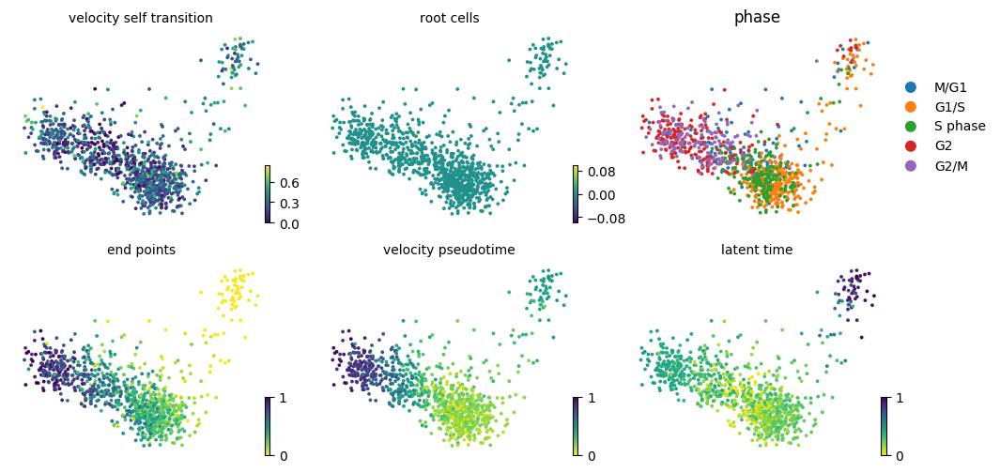

Trying to set attribute `.obs` of view, making a copy.


T47D WT G2 High Corr CycleGenes: 15
T47D WT M/G1 High Corr CycleGenes: 10
T47D WT G1/S High Corr CycleGenes: 13
T47D WT G2/M High Corr CycleGenes: 24
T47D WT S phase High Corr CycleGenes: 14
Skip filtering by dispersion since number of variables are less than `n_top_genes`



T47D WT G2 Variable High Corr CycleGenes: 15
T47D WT M/G1 Variable High Corr CycleGenes: 10
T47D WT G1/S Variable High Corr CycleGenes: 13
T47D WT G2/M Variable High Corr CycleGenes: 24
T47D WT S phase Variable High Corr CycleGenes: 14
recovering dynamics
    finished (0:00:12) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)
computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph
    finished (0:00:00) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing terminal states
    identified 0 region of root cells and 1 region of end points 
    finished 

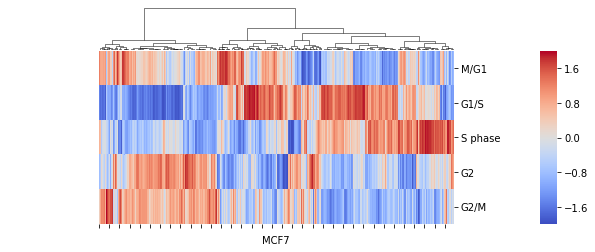

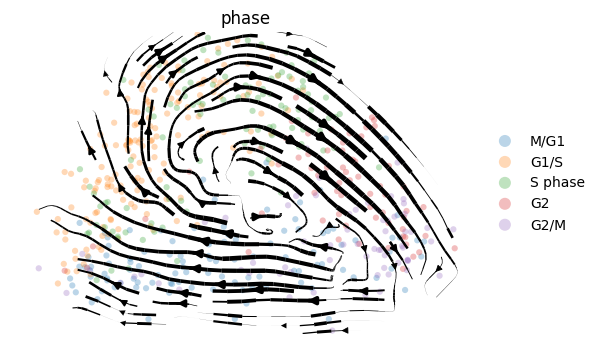

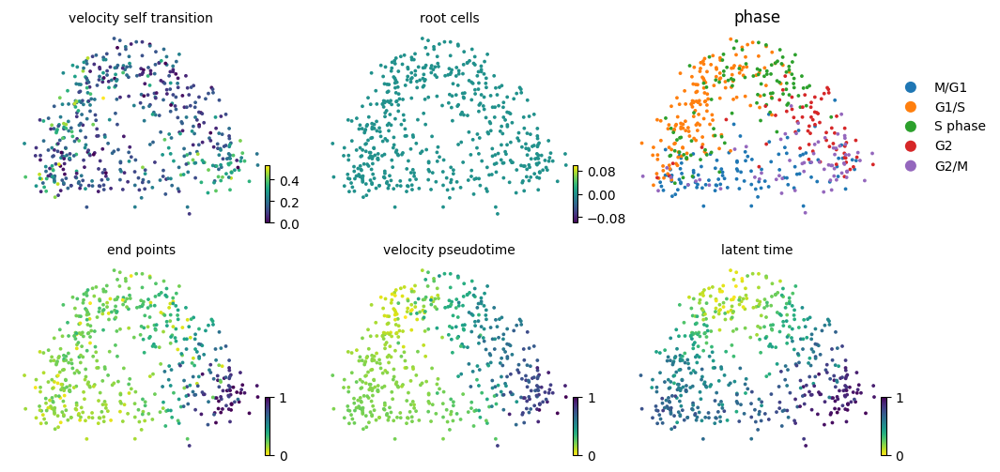

Trying to set attribute `.obs` of view, making a copy.


T47D KO G2 High Corr CycleGenes: 14
T47D KO M/G1 High Corr CycleGenes: 13
T47D KO G1/S High Corr CycleGenes: 15
T47D KO G2/M High Corr CycleGenes: 22
T47D KO S phase High Corr CycleGenes: 14
Skip filtering by dispersion since number of variables are less than `n_top_genes`



T47D KO G2 Variable High Corr CycleGenes: 14
T47D KO M/G1 Variable High Corr CycleGenes: 13
T47D KO G1/S Variable High Corr CycleGenes: 15
T47D KO G2/M Variable High Corr CycleGenes: 22
T47D KO S phase Variable High Corr CycleGenes: 14
recovering dynamics
    finished (0:00:12) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)
computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph
    finished (0:00:00) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing terminal states
    identified 0 region of root cells and 1 region of end points 
    finished 

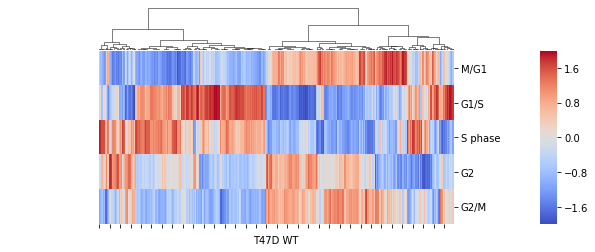

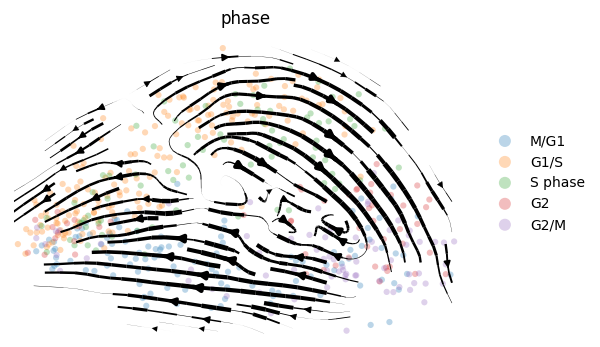

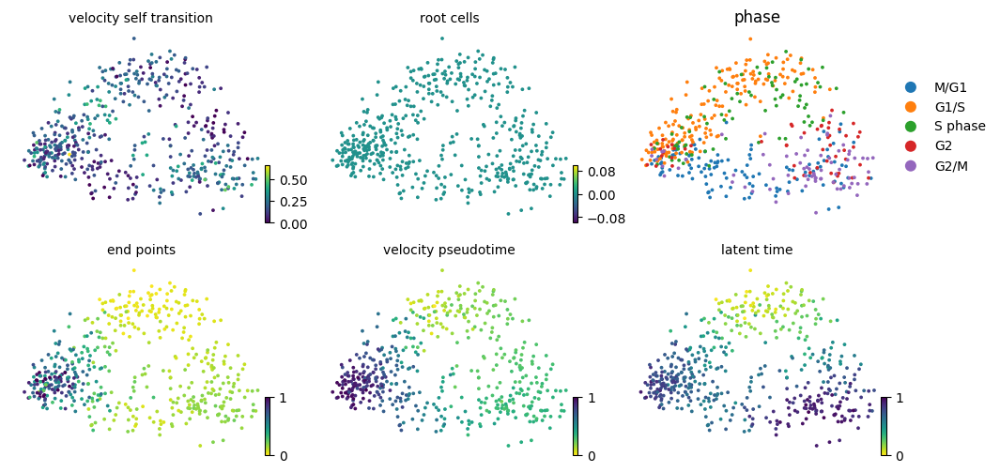

Trying to set attribute `.obs` of view, making a copy.


MM134 G2 High Corr CycleGenes: 17
MM134 M/G1 High Corr CycleGenes: 12
MM134 G1/S High Corr CycleGenes: 12
MM134 G2/M High Corr CycleGenes: 23
MM134 S phase High Corr CycleGenes: 10
Skip filtering by dispersion since number of variables are less than `n_top_genes`



MM134 G2 Variable High Corr CycleGenes: 17
MM134 M/G1 Variable High Corr CycleGenes: 12
MM134 G1/S Variable High Corr CycleGenes: 12
MM134 G2/M Variable High Corr CycleGenes: 23
MM134 S phase Variable High Corr CycleGenes: 10
recovering dynamics
    finished (0:00:09) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)
computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph
    finished (0:00:00) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing terminal states
    identified 0 region of root cells and 1 region of end points 
    finished (0:00:00) --> added


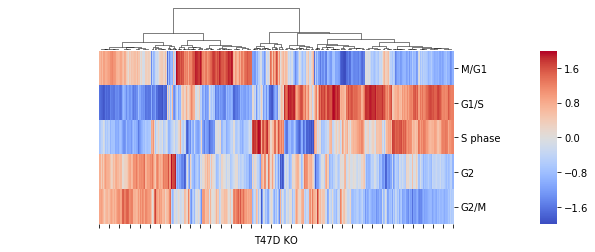

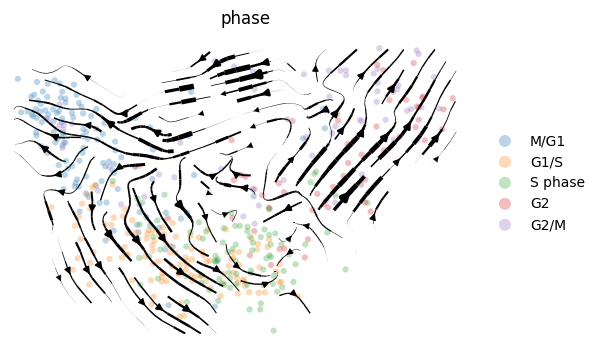

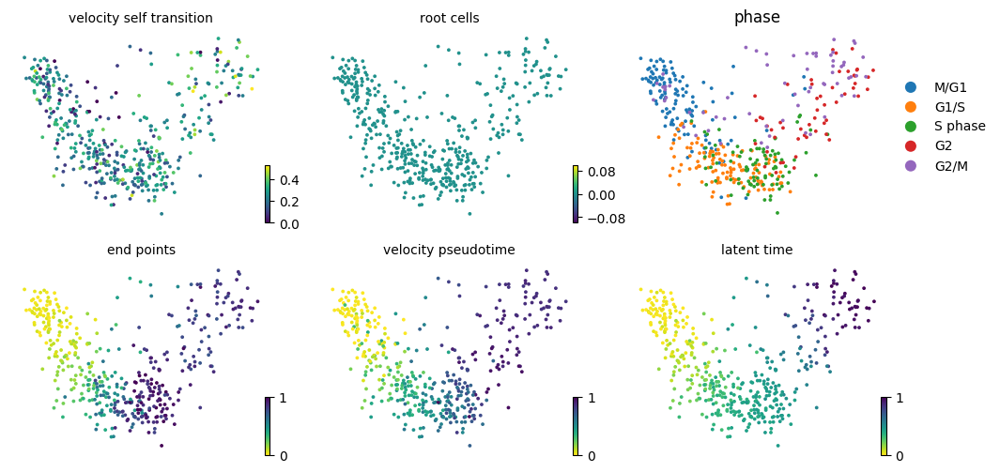

Trying to set attribute `.obs` of view, making a copy.


SUM44 G2 High Corr CycleGenes: 14
SUM44 M/G1 High Corr CycleGenes: 11
SUM44 G1/S High Corr CycleGenes: 13
SUM44 G2/M High Corr CycleGenes: 24
SUM44 S phase High Corr CycleGenes: 11
Skip filtering by dispersion since number of variables are less than `n_top_genes`



SUM44 G2 Variable High Corr CycleGenes: 14
SUM44 M/G1 Variable High Corr CycleGenes: 11
SUM44 G1/S Variable High Corr CycleGenes: 13
SUM44 G2/M Variable High Corr CycleGenes: 24
SUM44 S phase Variable High Corr CycleGenes: 11
recovering dynamics
    finished (0:00:08) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)
computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph
    finished (0:00:00) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing terminal states
    identified 0 region of root cells and 1 region of end points 
    finished (0:00:00) --> added


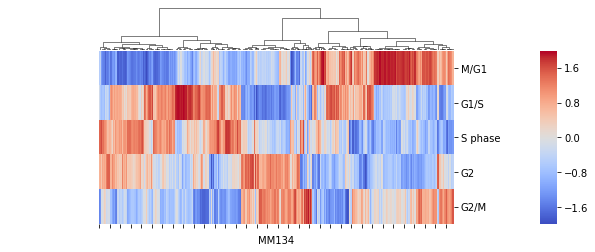

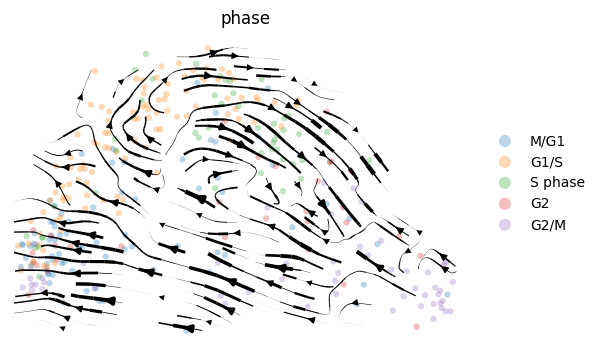

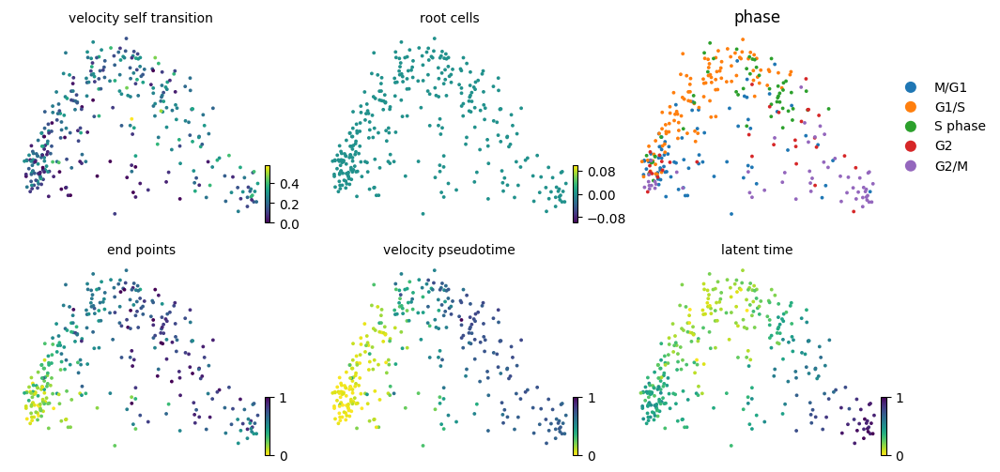

Trying to set attribute `.obs` of view, making a copy.


BCK4 G2 High Corr CycleGenes: 13
BCK4 M/G1 High Corr CycleGenes: 15
BCK4 G1/S High Corr CycleGenes: 12
BCK4 G2/M High Corr CycleGenes: 26
BCK4 S phase High Corr CycleGenes: 13
Skip filtering by dispersion since number of variables are less than `n_top_genes`



BCK4 G2 Variable High Corr CycleGenes: 13
BCK4 M/G1 Variable High Corr CycleGenes: 15
BCK4 G1/S Variable High Corr CycleGenes: 12
BCK4 G2/M Variable High Corr CycleGenes: 26
BCK4 S phase Variable High Corr CycleGenes: 13
recovering dynamics
    finished (0:00:12) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)
computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph
    finished (0:00:00) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing terminal states
    identified 1 region of root cells and 1 region of end points 
    finished (0:00:00) --> added
    'root_

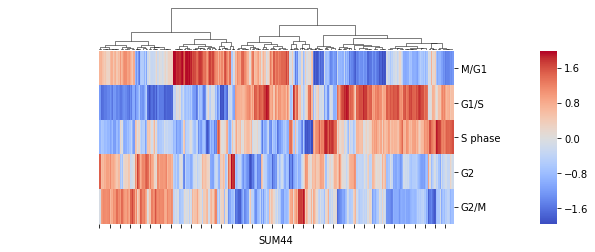

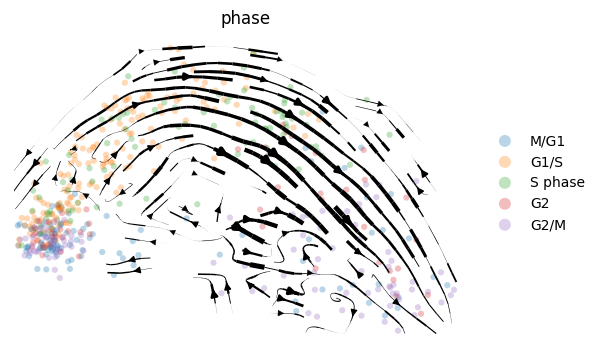

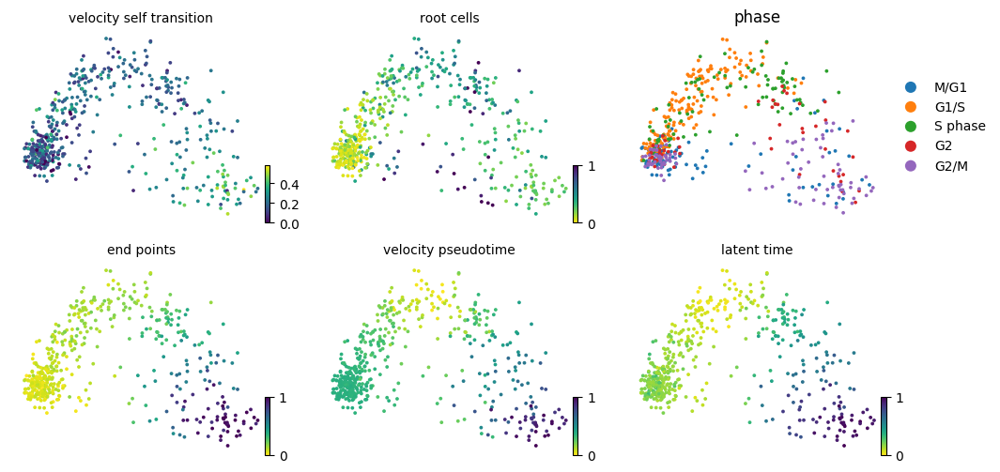

Trying to set attribute `.obs` of view, making a copy.


MCF10A G2 High Corr CycleGenes: 15
MCF10A M/G1 High Corr CycleGenes: 10
MCF10A G1/S High Corr CycleGenes: 12
MCF10A G2/M High Corr CycleGenes: 20
MCF10A S phase High Corr CycleGenes: 12
Skip filtering by dispersion since number of variables are less than `n_top_genes`



MCF10A G2 Variable High Corr CycleGenes: 15
MCF10A M/G1 Variable High Corr CycleGenes: 10
MCF10A G1/S Variable High Corr CycleGenes: 12
MCF10A G2/M Variable High Corr CycleGenes: 20
MCF10A S phase Variable High Corr CycleGenes: 12
recovering dynamics
    finished (0:00:11) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)
computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph
    finished (0:00:00) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing terminal states
    identified 0 region of root cells and 1 region of end points 
    finished (0:00:00) 

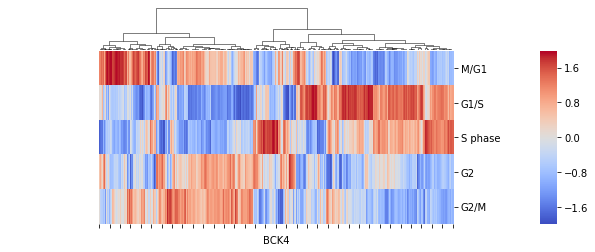

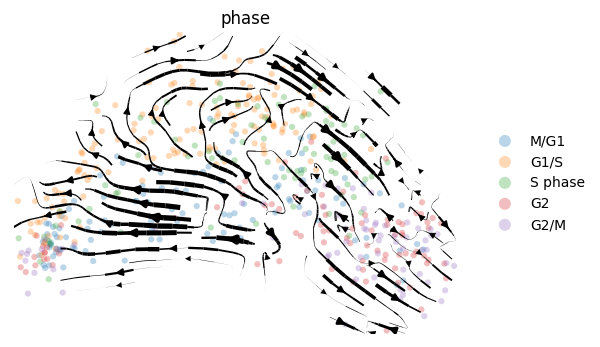

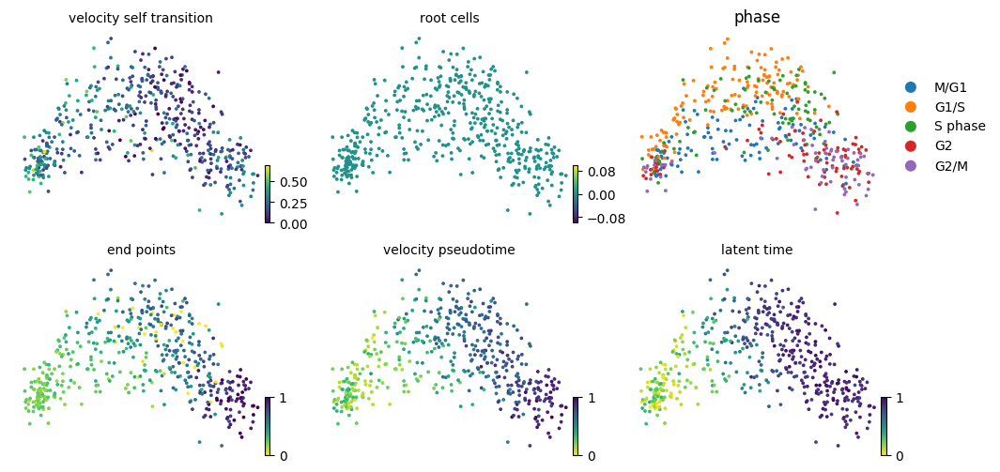

HEK293 G2 High Corr CycleGenes: 14
HEK293 M/G1 High Corr CycleGenes: 13
HEK293 G1/S High Corr CycleGenes: 10
HEK293 G2/M High Corr CycleGenes: 20


Trying to set attribute `.obs` of view, making a copy.


HEK293 S phase High Corr CycleGenes: 9
Skip filtering by dispersion since number of variables are less than `n_top_genes`



HEK293 G2 Variable High Corr CycleGenes: 14
HEK293 M/G1 Variable High Corr CycleGenes: 13
HEK293 G1/S Variable High Corr CycleGenes: 10
HEK293 G2/M Variable High Corr CycleGenes: 20
HEK293 S phase Variable High Corr CycleGenes: 9
recovering dynamics
    finished (0:00:07) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)
computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph
    finished (0:00:00) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing terminal states
    identified 1 region of root cells and 1 region of end points 
    finished (0:00:00) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)


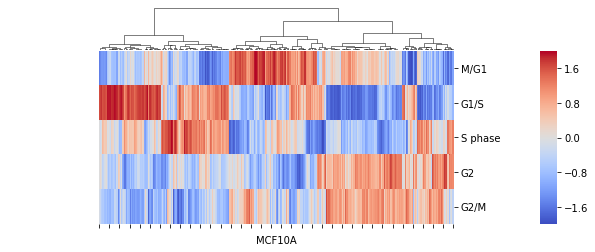

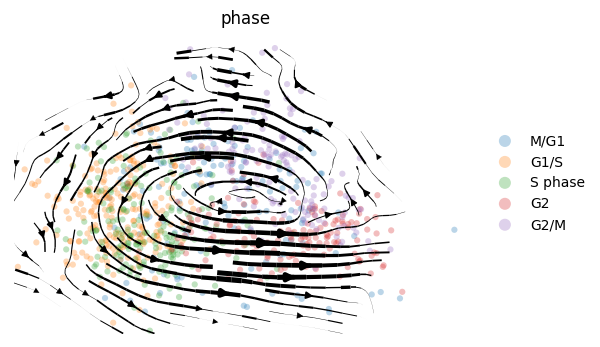

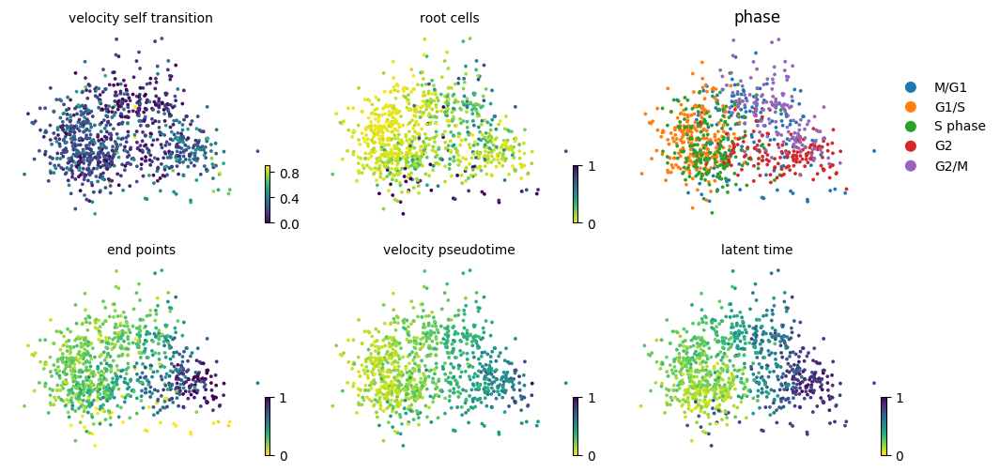

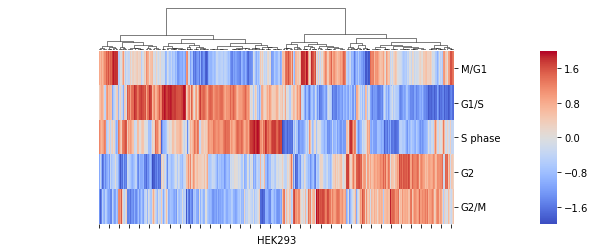

In [9]:
from scanpy.tools._score_genes import score_genes

CellCycle_dict = {}

for n, cell in enumerate(CellTypes):    
    tmp = Cell_dict[cell] # not copy, directly modify
    
    # calc phase score
    genes_cycle = {}
    for phase, series in Corr_dict[cell].items():
        if len(series) > 1:
            if by_qt:
                genes_s = series[series.values > np.quantile(series.values, corr_qt_thres)].index.tolist()
            else:
                genes_s = series[series.values > corr_thres].index.tolist() # used 0.3 from corr_df
            genes_cycle[phase] = genes_s
            score_genes(tmp, gene_list=genes_s, score_name=phase, ctrl_size=len(genes_s)) # use adata.X for scoring
            print(cell, phase, 'High Corr CycleGenes:', len(genes_s))

    # annotate phase       
    df_p_val = zscore(zscore(tmp.obs[phases], axis=0), axis=1) # first standardize PHASE/col-wise; then standardize CELL/row-wise # modify scores into Z-scores
    df_p = pd.DataFrame(df_p_val, index=tmp.obs.index, columns=phases)
    
    for phase in phases:
        tmp.obs[phase] = df_p[phase]
    tmp.obs['phase'] = [phases[x] for x in np.argmax(tmp.obs[phases].values, axis=1)]    
    cat_type = CategoricalDtype(categories=['M/G1', 'G1/S', 'S phase', 'G2', 'G2/M'], ordered=True) # set order of phases for color code
    tmp.obs['phase'] = tmp.obs['phase'].astype(cat_type)
    
    if n == 0:
        phases_mg = tmp.obs['phase']
    elif n > 0:
        phases_mg = phases_mg.append(tmp.obs['phase'])    
    
    # select only cycle genes, renormalize and pca, plot pca
    tmp_cycle = tmp[:,[item for sublist in genes_cycle.values() for item in sublist]]
    tmp_cycle.var_names_make_unique()
    scv.pp.filter_and_normalize(tmp_cycle, n_top_genes=n_top_cycle_genes) # not select top-var genes, adjust
    
    print('\n\n')
    for phase, genes in genes_cycle.items():
        print(cell, phase, 'Variable High Corr CycleGenes:', len(set(genes)&set(tmp_cycle.var.index)))
    
    sc.tl.pca(tmp_cycle, use_highly_variable=False) # By default uses them if they have been determined beforehand.
    
    scv.tl.recover_dynamics(tmp_cycle) 
    scv.tl.velocity(tmp_cycle, mode='stochastic')
    scv.tl.velocity_graph(tmp_cycle, basis=None)
    
    scv.tl.transition_matrix(tmp_cycle)
    scv.tl.terminal_states(tmp_cycle)
    scv.tl.recover_latent_time(tmp_cycle)
    
    # add phase too
    for phase in phases:
        tmp.obs[phase] = df_p[phase]
        
    CellCycle_dict[cell] = tmp_cycle
    
    # plot scatterplot
    scv.pl.velocity_embedding_stream(tmp_cycle, basis='pca', color='phase', size=80, 
                                     smooth=1, 
                                 figsize=(6,4), linewidth=2, dpi=100, density=0.5,
                                 legend_loc='right margin', alpha=0.3)

    scv.pl.scatter(tmp_cycle, color=['velocity_self_transition','root_cells','phase', 
                                     'end_points','velocity_pseudotime','latent_time'], basis='pca', 
                   ncols=3, legend_loc='right margin', size=30, figsize=(4,3), dpi=100, xlabel=cell)

    # plot heatmap based on phase scores
    g = sns.clustermap(df_p.T, row_cluster=False,
                  method='ward', metric='euclidean', cmap='coolwarm', figsize=(8,4))
    g.ax_heatmap.set_xticklabels('')
    g.ax_heatmap.set_xlabel(cell)
    plt.setp(g.ax_heatmap.yaxis.get_majorticklabels(), rotation=0)
    
    cbar = g.cax
    x0,y0,x1,y1 = np.array(g.ax_heatmap.get_position()).flatten()
    cbar.set_position([x1+0.15, y0, 0.03, y1-y0])


In [11]:
fname = 'CellCycleAdataDict'
f = open("../data/scVelo/%s.pkl"%(fname),"wb")
pickle.dump(CellCycle_dict,f)
f.close()

In [125]:
nobs = adata_m.obs[[x for x in adata_m.obs if x!='phase']].join(pd.DataFrame(phases_mg, columns=['phase']), how='left')
tbl = nobs.groupby(['CellType', 'phase']).size().unstack().loc[:,['M/G1', 'G1/S', 'S phase', 'G2', 'G2/M']]
tbl

phase,M/G1,G1/S,S phase,G2,G2/M
CellType,,,,,
MCF7,135,322,201,189,130
T47D WT,115,172,80,75,67
T47D KO,115,177,72,61,66
MM134,119,115,89,49,67
SUM44,72,107,48,32,55
BCK4,126,165,94,58,69
MCF10A,95,143,87,102,64
HEK293,136,245,193,150,157


In [126]:
adata_m.obs = nobs 
adata_m.write('../data/scVelo/AL1.h5ad')

# CellDict

# Write counts files

## for GSVA
- GSVA [help blog](https://support.bioconductor.org/p/107466/)
    - 1. to calc 3000 X 8 cell lines => thus all of them comparable
    - 2. only compare T47Ds => pre-processing them together => 5000 genes profile
    - DataFormat: `logNorm`, kcdf='Gaussian', method='gsva/ssgsea', `gene X cell`

In [108]:
adata_ref_norm = sc.read('../data/scVelo/AL1_ref_norm.h5ad')

logNormCts = pd.DataFrame(adata_ref_norm.X.todense(), index=adata_ref_norm.obs.index, columns=adata_ref_norm.var.index).T # gene x cell
logNormCts.to_csv('../data/Counts/adata_ref_norm.logNormCts.csv')

## for pySCENIC
- Require raw counts, thus not normalized; just specify cells from `../data/scVelo/AL1_ref_raw.h5ad`, which is before normalization but after cell filtering

## for submission to GEO

In [109]:
raw = sc.read('../data/scVelo/AL1_ref_raw.h5ad')
raw 

AnnData object with n_obs × n_vars = 4614 × 33538 
    obs: 'Clusters', '_X', '_Y', 'doublet_bln', 'doublet_score', 'percent_mito', 'n_counts', 'n_genes'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced'

In [113]:
!mkdir ../data/GEO_Submission 

In [114]:
# # after cell and gene filtering
scv.pp.filter_genes(raw, min_cells=2)
raw.obs.index = [x.replace('AL1','CellLine') for x in raw.obs.index]

rawCts = pd.DataFrame(raw.X.toarray(), index=raw.obs.index, columns=raw.var.index)
print(rawCts.shape)

rawCts.to_csv('../data/GEO_Submission/scRNA_RawCounts.csv')

(4614, 21888)


In [115]:
rawCts.head(3) 

index,LINC00115,FAM41C,AL645608.1,NOC2L,PERM1,AL645608.8,HES4,RNF223,C1orf159,TNFRSF18,...,FAM50A,PLXNA3,IKBKG,DKC1,F8A1,FUNDC2,BRCC3,VBP1,SPRY3,VAMP7
CellLine:AAAGTGAGTCATAGTCx,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,...,1.0,0.0,0.0,1.0,0.0,0.0,1.0,2.0,0.0,0.0
CellLine:AAAGAACGTAACAAGTx,0.0,0.0,0.0,3.0,0.0,0.0,12.0,1.0,0.0,0.0,...,6.0,0.0,0.0,6.0,0.0,2.0,0.0,4.0,0.0,2.0
CellLine:AAACGCTGTAGACACGx,0.0,0.0,0.0,1.0,0.0,0.0,6.0,0.0,1.0,0.0,...,2.0,0.0,0.0,4.0,0.0,3.0,0.0,4.0,0.0,0.0


In [128]:
AL1 = sc.read('../data/scVelo/AL1.h5ad')
AL1 

AnnData object with n_obs × n_vars = 4614 × 3000 
    obs: 'Clusters', '_X', '_Y', 'doublet_bln', 'doublet_score', 'percent_mito', 'n_counts', 'n_genes', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'louvain', 'CellType', 'phase'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'means', 'dispersions', 'dispersions_norm'
    uns: 'louvain', 'louvain_colors', 'neighbors', 'pca', 'rank_genes_groups'
    obsm: 'X_pca', 'X_tsne', 'X_umap'
    varm: 'PCs'
    layers: 'Ms', 'Mu', 'ambiguous', 'matrix', 'spliced', 'unspliced'

In [129]:
# meta
meta = AL1.obs[['percent_mito', 'n_counts', 'n_genes', 'CellType', 'phase']]
meta.index = [x.replace('AL1','CellLine') for x in meta.index]

meta.to_csv('../data/GEO_Submission/scRNA_metaInfo.csv')

In [130]:
meta.head(3) 

,percent_mito,n_counts,n_genes,CellType,phase
CellLine:AAAGTGAGTCATAGTCx,0.079865,4170.965820,2799,MM134,M/G1
CellLine:AAAGAACGTAACAAGTx,0.110345,4184.733398,5185,T47D KO,S phase
CellLine:AAACGCTGTAGACACGx,0.122554,4054.348633,4144,T47D WT,G2/M


In [131]:
AL1.obs.index = [x.replace('AL1','CellLine') for x in AL1.obs.index]

AL1Cts = pd.DataFrame(AL1.X.toarray(), index=AL1.obs.index, columns=AL1.var.index)
print(AL1Cts.shape)

AL1Cts.to_csv('../data/GEO_Submission/scRNA_3000genes_logNormCounts.csv')

(4614, 3000)


In [132]:
AL1Cts.head(3)

index,AL645608.8,HES4,RNF223,TNFRSF18,MXRA8,FNDC10,TMEM52,HES5,GPR153,HES2,...,BX546450.1,MAGEA3,MAGEA12,PNMA6A,MAGEA1,ZNF275,BGN,DUSP9,ABCD1,F8A1
CellLine:AAAGTGAGTCATAGTCx,0.0,1.813765,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.000000,0.0,0.0,0.0,0.0,1.271654,0.0,0.0,0.0
CellLine:AAAGAACGTAACAAGTx,0.0,2.161650,0.494974,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.072051,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0
CellLine:AAACGCTGTAGACACGx,0.0,1.984370,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0


## for Digital Ocean Server

In [7]:
AL1 = sc.read('../data/scVelo/AL1.h5ad')
AL1 

AnnData object with n_obs × n_vars = 4614 × 3000 
    obs: 'Clusters', '_X', '_Y', 'doublet_bln', 'doublet_score', 'percent_mito', 'n_counts', 'n_genes', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'louvain', 'CellType', 'phase'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'means', 'dispersions', 'dispersions_norm'
    uns: 'louvain', 'louvain_colors', 'neighbors', 'pca', 'rank_genes_groups'
    obsm: 'X_pca', 'X_tsne', 'X_umap'
    varm: 'PCs'
    layers: 'Ms', 'Mu', 'ambiguous', 'matrix', 'spliced', 'unspliced'

In [26]:
ada = AL1.copy()
obs_new = AL1.obs[['CellType','phase','percent_mito', 'n_counts', 'n_genes']]
obs_new.columns = ['Cell Type', 'Phase', 'Mitochondrial Reads Percent','Number of Counts','Number of Genes']
obs_new['Histology'] = ['IDC' if x in ['MCF7','T47D WT'] else 'CDH1 KO IDC' if x=='T47D KO' else 'Noncancerous Breast' if x=='MCF10A' else 'Human Embryonic Kidney' if x=='HEK293' else 'ILC' for x in AL1.obs['CellType']]


In [27]:
pam50_tumorRef = pd.read_csv('../data/PAM50/PAM50_AL1_ERposTumorCentroid.csv', index_col=0)
PAM50 = [pam50_tumorRef.index[np.argmax(pam50_tumorRef.values[:,j])] for j in range(pam50_tumorRef.shape[1])]
Dict = {pam50_tumorRef.columns[i]:PAM50[i] for i in range(len(PAM50))}

obs_new['PAM50 (ER+ Tumor Ref)'] = np.array([Dict[x] if x in Dict.keys() else 'None' for x in AL1.obs_names])

pam50_CellRef = pd.read_csv('../data/PAM50/PAM50_AL1_CellLineCentroid.csv', index_col=0)
PAM50 = [pam50_CellRef.index[np.argmax(pam50_CellRef.values[:,j])] for j in range(pam50_CellRef.shape[1])]
Dict = {pam50_CellRef.columns[i]:PAM50[i] for i in range(len(PAM50))}

obs_new['PAM50 (Cell Lines Ref)'] = np.array([Dict[x] if x in Dict.keys() else 'None' for x in AL1.obs_names])
obs_new.index = [x.replace('AL1',obs_new['Cell Type'][i]) for i,x in enumerate(obs_new.index)]

obs_new

,Cell Type,Phase,Mitochondrial Reads Percent,Number of Counts,Number of Genes,Histology,PAM50 (ER+ Tumor Ref),PAM50 (Cell Lines Ref)
MM134:AAAGTGAGTCATAGTCx,MM134,M/G1,0.079865,4170.965820,2799,ILC,LumA,LumA
T47D KO:AAAGAACGTAACAAGTx,T47D KO,S phase,0.110345,4184.733398,5185,CDH1 KO IDC,LumA,Her2
T47D WT:AAACGCTGTAGACACGx,T47D WT,G2/M,0.122554,4054.348633,4144,IDC,LumB,LumB
MCF7:AAAGGGCCAGCAATTCx,MCF7,G2/M,0.118728,4794.800293,5663,IDC,LumA,LumA
MCF7:AACAAAGGTTGAATCCx,MCF7,S phase,0.082108,4291.596680,4354,IDC,LumA,LumA
...,...,...,...,...,...,...,...,...
BCK4:TTTGATCGTTGCACGCx,BCK4,S phase,0.071091,7485.206543,3107,ILC,LumA,LumB
MCF7:TTTGTTGCATCAGCGCx,MCF7,G1/S,0.069593,4723.968262,3533,IDC,LumA,LumA
SUM44:TTTGGTTGTGATACAAx,SUM44,G1/S,0.122275,5506.973633,4975,ILC,LumA,LumA
MCF10A:TTTGACTGTTAGTTCGx,MCF10A,M/G1,0.049567,6164.537598,4134,Noncancerous Breast,LumA,LumA


In [28]:
ada.obs = obs_new 

In [29]:
ada.write('../data/scVelo/Server.3000g.h5ad')

... storing 'Histology' as categorical
... storing 'PAM50 (ER+ Tumor Ref)' as categorical
... storing 'PAM50 (Cell Lines Ref)' as categorical
